In [1]:
import orpheus
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
gnnn_fine = orpheus.GNNNCorrelation_NoTomo(min_sep=0.0625,max_sep=256.,binsize=0.07,nbinsphi=400,nmaxs=30,verbosity=3,nthreads=110)

gnnn_fine.nbinsr**3/110

15319.627272727274

In [ ]:
%%time
ccl_theory = np.loadtxt('/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/scripts/N3M_integration/ccl_secondorder.txt')

from scipy.interpolate import interp1d
xinn_spl = interp1d(x=ccl_theory[0],y=ccl_theory[1], bounds_error=False,fill_value=0)
xing_spl = interp1d(x=ccl_theory[0],y=ccl_theory[2], bounds_error=False,fill_value=0)
apradii = np.geomspace(2,32,13)
gnnn_asmocks = orpheus.GNNNCorrelation_NoTomo(min_sep=0.25,max_sep=210.,binsize=0.2,nbinsphi=256,nmaxs=10,verbosity=3,nthreads=110)
gnnn_fine = orpheus.GNNNCorrelation_NoTomo(min_sep=0.0625,max_sep=256.,binsize=0.07,nbinsphi=400,
nmaxs=30,
verbosity=3,nthreads=110,rmin_pixsize=200)
mapnap3_asmocks = gnnn_asmocks.MapNap3analytic(
    mapradii=apradii, xing_spl=xing_spl, xinn_spl=xinn_spl, thetamin_xi=0.001, thetamax_xi=1000., ntheta_xi=5000000, 
    nsubr=3, batchsize=None, basis='MapMx')[0]
mapnap3_fine = gnnn_fine.MapNap3analytic(
    mapradii=apradii, xing_spl=xing_spl, xinn_spl=xinn_spl, thetamin_xi=0.001, thetamax_xi=1000., ntheta_xi=5000000, 
    nsubr=3, batchsize=15500, basis='MapMx')[0]
gnnn_asmocks.bin_centers_mean = .5*gnnn_asmocks.bin_edges[1:]+.5*gnnn_asmocks.bin_edges[:-1]
#xing_at_centers = xing_spl(gnnn_asmocks.bin_centers_mean)
#mapnap3_corr = gnnn_asmocks.MapNap3_corrections(
#    apradii=apradii, xi_ng=xing_at_centers, Gtilden_third=None, Normn_third=None, include_second=True, include_third=False)

(0, <class 'numpy.float64'>, <class 'ctypes.c_double'>)
0.0625
(1, <class 'numpy.float64'>, <class 'ctypes.c_double'>)
256.0
(2, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
119
(3, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (400,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[0.00785398 0.02356194 0.03926991 0.05497787 0.07068583 0.0863938
 0.10210176 0.11780972 0.13351769 0.14922565 0.16493361 0.18064158
 0.19634954 0.2120575  0.22776547 0.24347343 0.25918139 0.27488936
 0.29059732 0.30630528 0.32201325 0.33772121 0.35342917 0.36913714
 0.3848451  0.40055306 0.41626103 0.43196899 0.44767695 0.46338492
 0.47909288 0.49480084 0.51050881 0.52621677 0.54192473 0.5576327
 0.57334066 0.58904862 0.60475659 0.62046455 0.63617251 0.65188048
 0.66758844 0.6832964  0.69900437 0.71471233 0.73042029 0.74612826
 0.76183622 0.77754418 0.79325215 0.80896011 0.82466807 0.84037603
 0.856084   0.87179196 0.88749992 0.90320789 0.91891585 0.93462381
 0.95033178 0.96603974 0.9817477  0.

In [11]:
Tp = lambda x: 1./128. * (x**4-16*x**2+32) * np.exp(-x**2/4.)
Tx = lambda x: x**2./128. * (12 - x**2) * np.exp(-x**2/4.)
nap2 = np.zeros(len(apradii))
mapnap = np.zeros(len(apradii))
for elr, mapR in enumerate(apradii):
    xi_nn = .5*(ccl_theory[1][1:]+ccl_theory[1][:-1])
    xi_ng = .5*(ccl_theory[2][1:]+ccl_theory[2][:-1])
    _dr = ccl_theory[0][1:]-ccl_theory[0][:-1]
    _centers = ccl_theory[0][:-1] + .5*_dr
    nap2[elr] = np.sum(_dr*_centers/(mapR**2) * Tp(_centers/mapR) * xi_nn)
    mapnap[elr] = np.sum(_dr*_centers/(mapR**2) * Tx(_centers/mapR) * xi_ng)    

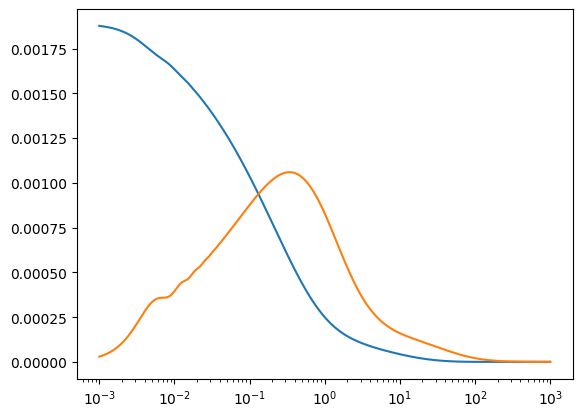

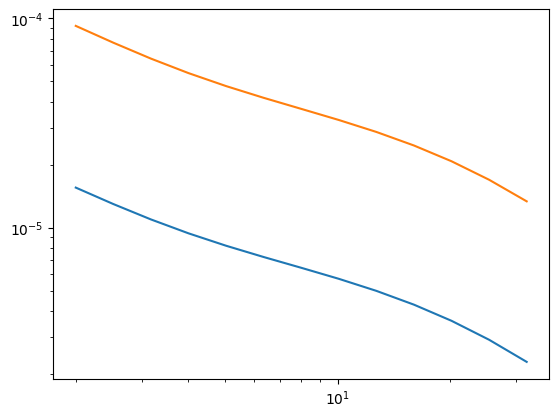

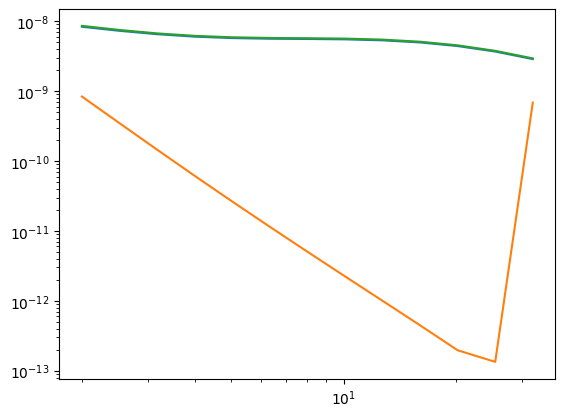

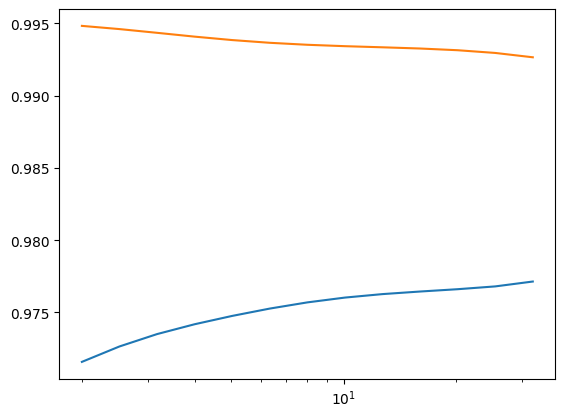

In [12]:
plt.semilogx(ccl_theory[0],ccl_theory[1])
plt.semilogx(ccl_theory[0],ccl_theory[2])
plt.show()

plt.loglog(apradii,nap2)
plt.loglog(apradii,mapnap)
plt.show()

plt.loglog(apradii,apradii*mapnap3_asmocks[0])
plt.loglog(apradii,apradii*mapnap3_corr[0])
plt.loglog(apradii,apradii*3*mapnap*nap2)
#plt.loglog(apradii,apradii*mapnap3fine[0])
plt.show()

plt.semilogx(apradii,mapnap3_asmocks[0]/(3*mapnap*nap2))
plt.semilogx(apradii,mapnap3_fine[0]/(3*mapnap*nap2))

1

# Computing galaxy-galaxy-galaxy-galaxy lensing statistics

In this notebooks we compute the galaxy-galaxy-galaxy-galaxy lensing (G4L) shear correlation functions on a mock catalog and transform them to the third-order aperture statistics.

In [1]:
from astropy.table import Table
import numpy as np
from matplotlib import pyplot as plt

import orpheus

In [2]:
def gtilde_gauss(spl_nn,spl_ng,thetas1,thetas2,thetas3,phi12s,phi13s):
    phi23s = phi13s-phi12s
    thetas12 = np.sqrt(thetas1**2+thetas2**2-2*thetas1*thetas2*np.cos(phi12s))
    thetas13 = np.sqrt(thetas1**2+thetas3**2-2*thetas1*thetas3*np.cos(phi13s))
    thetas23 = np.sqrt(thetas2**2+thetas3**2-2*thetas2*thetas3*np.cos(phi23s))
    res  = spl_nn(thetas12)*spl_ng(thetas3)*np.exp(1J*phi13s)
    res += spl_nn(thetas13)*spl_ng(thetas2)*np.exp(1J*(phi12s-phi23s))
    res += spl_nn(thetas23)*spl_ng(thetas1)*np.exp(-1J*phi13s)
    return res

## Initialize the catalog instances

For this exercise we use a simplistic mock catalog built from the [Takahasi simulation suite](http://cosmo.phys.hirosaki-u.ac.jp/takahasi/allsky_raytracing) that traces two tomographic bins in a _Euclid_-like setup for the $n(z)$ and uses a linear galaxy bias. 

As we are dealing with two separate catalogs, we need to initialize a `ScalarTracerCatalog` instance for the lenses and a `SpinTracerCatalog` (with `spin=2`) for the sources.

In [3]:
catname = "data_g3l.npz"

In [4]:
mock = np.load(catname)

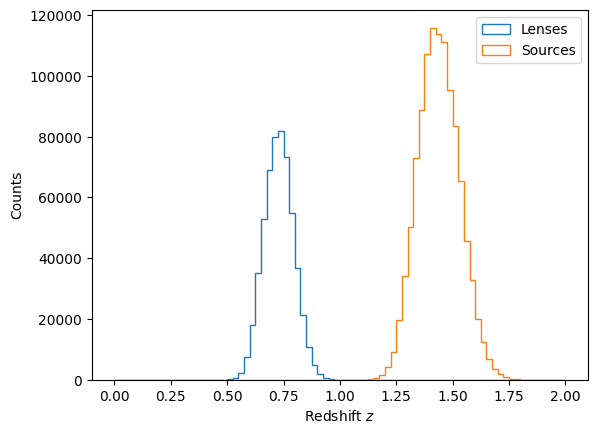

In [5]:
plt.hist(mock['z_lens_true'],bins=np.linspace(0,2,81),histtype='step',lw=3,label='Lenses')
plt.hist(mock['z_source_true'],bins=np.linspace(0,2,81),histtype='step',lw=3,label='Sources')
plt.xlabel(r'Redshift $z$')
plt.ylabel('Counts')
plt.legend()
plt.show()

In [6]:
fthin_source = 1
fthin_lens = 1
lensshuffle =  np.arange(len(mock["x_lens"]))
sourceshuffle =  np.arange(len(mock["x_source"]))
np.random.seed(42)
np.random.shuffle(x=lensshuffle)
np.random.shuffle(x=sourceshuffle)

sources = orpheus.SpinTracerCatalog(spin=2,
                                    pos1=mock["x_source"][sourceshuffle][::fthin_source], 
                                    pos2=mock["y_source"][sourceshuffle][::fthin_source],
                                    tracer_1=mock["gam1_source"][sourceshuffle][::fthin_source],
                                    tracer_2=mock["gam2_source"][sourceshuffle][::fthin_source], 
                                    weight=None, zbins=None)
lenses = orpheus.ScalarTracerCatalog(pos1=mock["x_lens"][lensshuffle][::fthin_lens], 
                                     pos2=mock["y_lens"][lensshuffle][::fthin_lens], 
                                     tracer=np.ones_like(mock["x_lens"][lensshuffle][::fthin_lens]), 
                                     weight=None, zbins=None)

In [7]:
print("Number of source galaxies:%i --> effective nbar: %.3f/arcmin^2 on %.2f deg^2"%(
    sources.ngal, sources.ngal/(sources.len1*sources.len2), sources.len1*sources.len2/3600.))
print("Number of lens galaxies:%i --> effective nbar: %.3f/arcmin^2 on %.2f deg^2"%(
    lenses.ngal, lenses.ngal/(lenses.len1*lenses.len2), lenses.len1*lenses.len2/3600.))

Number of source galaxies:1098203 --> effective nbar: 2.848/arcmin^2 on 107.10 deg^2
Number of lens galaxies:551207 --> effective nbar: 1.431/arcmin^2 on 107.02 deg^2


## Computation of the shear-lens-lens-lens correlation function (few bins)

For computing the shear-lens-lens correlation function we need to invoke the `GNNNCorrelation_NoTomo` class. In principle, it is only required to define a binning for the 4pcf (given by the range of the bins and the number of bins).

Let us first showcase that in the case of a coarsely binned 4PCF the actual computation is not too expensive. As in this case also the memory footprint of the 4PCF is small, we can use a runtime-optimised implementation (i.e. we set `lowmem=False`) and we further accelerate the estimator using the `Tree`-approximation.

In [10]:
min_sep = 0.25
max_sep = 210.
binsize = 0.15
nbinsphi = 200
nmaxs=20
method = "Tree"
tree_resos = [0,1]
rmin_pixsize=200
apradii = np.geomspace(1,32,16)
nthreads = 55

In [11]:
gnnn = orpheus.GNNNCorrelation_NoTomo(min_sep=min_sep,max_sep=max_sep,binsize=binsize,nbinsphi=nbinsphi,nmaxs=nmaxs,
                                      tree_resos=tree_resos,method=method,verbosity=3,rmin_pixsize=rmin_pixsize,
                                      nthreads=nthreads,multicountcorr=True)
gnnn.zweighting=None

In [ ]:
%%time
gnnn.process(sources, lenses, lowmem=False, statistics='4pcf_multipole')

(0, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
2
(1, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (3,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[  0.25 100.   210.  ]
(2, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (1098203,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1. 1. 1. ... 1. 1. 1.]
(3, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (1098203,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1. 1. 1. ... 1. 1. 1.]
(4, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (1098203,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[-190.27711487   78.80538177   22.65649414 ... -185.58009338 -306.3276062
 -155.40576172]
(5, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (1098203,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[ 289.94226074   -1.80413401  -69.91029358 ...  202.47642517   62.93252563
 -248.42530823]
(6, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (1098203,), <class 'numpy.ctypeslib.ndpointer_<

In [10]:
# Load 2pt data
import numpy as np
from matplotlib import pyplot as plt
napmap_fsky = np.load("/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/data/Mocks_NG_zlens1_zsource8.npz")
napmap_mean = np.mean(napmap_fsky["NG"],axis=0)


fbase = "/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/data/"
paths_kkcorr_hr_rshift =  [fbase+"t17mock_2pcffromkappag_nside16384_zbin1_patch%i_4_randomshift42.npz"%(patch) for patch in range(1,5)]

for elp,p in enumerate(paths_kkcorr_hr_rshift):
    nextp = np.load(p)
    if elp==0:
        dat_kkcorr_hr_rshift = {}
        for k in nextp.files:
            dat_kkcorr_hr_rshift[k] = np.zeros_like(nextp[k])
    for k in nextp.files:
        dat_kkcorr_hr_rshift[k] += 1./len(paths_kkcorr_hr_rshift)*nextp[k][:]


# Get GNNN_disc over ensemble from 2pt
from scipy.interpolate import interp1d

xinn_spl = interp1d(x=dat_kkcorr_hr_rshift['thetas'],y=dat_kkcorr_hr_rshift['kkcorr_ext'], bounds_error=False,fill_value=0)
xing_spl = interp1d(x=np.mean(napmap_fsky['bin_centers'],axis=0),y=np.mean(napmap_fsky['xi_ng'],axis=0), bounds_error=False,fill_value=0)

mapnap3 = gnnn.MapNap3analytic(mapradii=apradii, xing_spl=xing_spl, xinn_spl=xinn_spl, thetamin_xi=0.025, thetamax_xi=250., ntheta_xi=130, 
                               nsubr=2, nsubsample_filter=1, batchsize=None, basis='MapMx')[0]

Using batchsize of 357 for radial bins
(0, <class 'numpy.float64'>, <class 'ctypes.c_double'>)
0.25
(1, <class 'numpy.float64'>, <class 'ctypes.c_double'>)
210.0
(2, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
27
(3, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (200,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[0.01570796 0.04712389 0.07853982 0.10995574 0.14137167 0.1727876
 0.20420352 0.23561945 0.26703538 0.2984513  0.32986723 0.36128316
 0.39269908 0.42411501 0.45553093 0.48694686 0.51836279 0.54977871
 0.58119464 0.61261057 0.64402649 0.67544242 0.70685835 0.73827427
 0.7696902  0.80110613 0.83252205 0.86393798 0.89535391 0.92676983
 0.95818576 0.98960169 1.02101761 1.05243354 1.08384947 1.11526539
 1.14668132 1.17809725 1.20951317 1.2409291  1.27234502 1.30376095
 1.33517688 1.3665928  1.39800873 1.42942466 1.46084058 1.49225651
 1.52367244 1.55508836 1.58650429 1.61792022 1.64933614 1.68075207
 1.712168   1.74358392 1.77499985 1.80641578 1.8378317  1.86924763

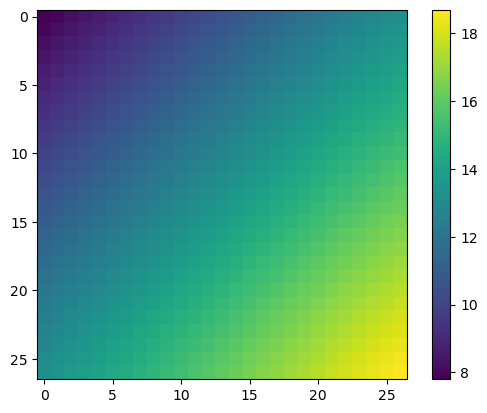

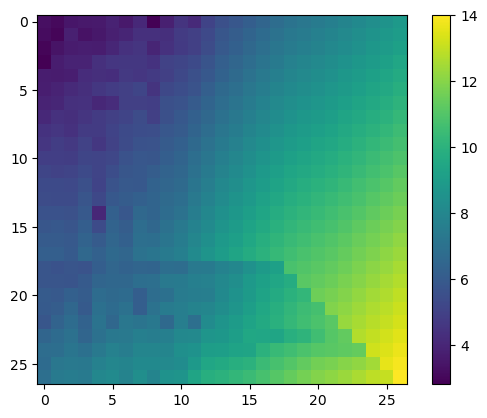

In [11]:
n2 = nmaxs
n3 = nmaxs
elr = 18
plt.imshow(np.log10(np.abs(gnnn.npcf_multipoles_norm[n2,n3,0,elr])))
plt.colorbar()
plt.show()

plt.imshow(np.log10(np.abs(gnnn.npcf_multipoles[0,n2,n3,0,elr])))
plt.colorbar()
plt.show()

In [12]:
gnnn.bin_centers_mean = gnnn.bin_centers_mean[0]

In [12]:
elr1 = 15
elr2 = 6
elr3 = 6
elphi12 = 130
elphi13 = 40

def gtilde_gauss(spl_nn,spl_ng,thetas1,thetas2,thetas3,phi12s,phi13s):
    phi23s = phi13s-phi12s
    thetas12 = np.sqrt(thetas1**2+thetas2**2-2*thetas1*thetas2*np.cos(phi12s))
    thetas13 = np.sqrt(thetas1**2+thetas3**2-2*thetas1*thetas3*np.cos(phi13s))
    thetas23 = np.sqrt(thetas2**2+thetas3**2-2*thetas2*thetas3*np.cos(phi23s))
    res  = spl_nn(thetas12)*spl_ng(thetas3)*np.exp(1J*phi13s)
    res += spl_nn(thetas13)*spl_ng(thetas2)*np.exp(1J*(phi12s-phi23s))
    res += spl_nn(thetas23)*spl_ng(thetas1)*np.exp(-1J*phi13s)
    return res

phis13, phis12 = np.meshgrid(gnnn.phis[0],gnnn.phis[1])
npcf_rcombi, npcf_norm_out = gnnn.multipoles2npcf_singlethetcombi(elr1,elr2,elr3)
npcfgauss_rcombi = gtilde_gauss(xinn_spl,xing_spl,gnnn.bin_centers_mean[elr1],gnnn.bin_centers_mean[elr2],gnnn.bin_centers_mean[elr3],phis12,phis13)

plt.imshow(npcf_rcombi[0].real)
plt.colorbar()
plt.show()

plt.imshow(npcfgauss_rcombi.real)
plt.colorbar()
plt.show()

gnnn_diag_fixed = np.zeros((len(gnnn.bin_centers_mean),gnnn.nbinsphi[0],gnnn.nbinsphi[1]),dtype=complex)
gnnn_diag_fixedgauss = np.zeros((len(gnnn.bin_centers_mean),gnnn.nbinsphi[0],gnnn.nbinsphi[1]),dtype=complex)

for elr in range(gnnn.nbinsr):
    gnnn_diag_fixed[elr] = gnnn.multipoles2npcf_singlethetcombi(elr,elr2,elr3)[0]
    gnnn_diag_fixedgauss[elr] = gtilde_gauss(xinn_spl,xing_spl,gnnn.bin_centers_mean[elr],gnnn.bin_centers_mean[elr2],gnnn.bin_centers_mean[elr3],phis12,phis13)


plt.plot(gnnn_diag_fixed[:,elphi12,elphi13].real,'b-')
plt.plot(gnnn_diag_fixed[:,elphi12,elphi13].imag,'r-')

plt.plot(gnnn.bin_centers_mean[elr2]**1.*gnnn_diag_fixedgauss[:,elphi12,elphi13].real,'b--')
plt.plot(gnnn.bin_centers_mean[elr2]**1.*gnnn_diag_fixedgauss[:,elphi12,elphi13].imag,'r--')

ValueError: not enough values to unpack (expected 7, got 0)

In [14]:
#mn3disc = gnnndisc.computeMapNap3(apradii)
mn3 = gnnn.computeMapNap3(apradii)

 Done 100.00 per cent of Multipole to MN3 trafos.

In [14]:
mapnap3

array([[-3.24635412e-07+1.96614800e-22j, -1.62317706e-07+1.53862652e-22j,
        -8.11588531e-08+6.39399265e-23j, -4.05794265e-08+3.11644204e-23j,
        -2.02897133e-08+1.92328315e-23j, -1.01448566e-08+7.99249081e-24j,
        -5.07242832e-09+3.89555256e-24j, -2.53621416e-09+2.76615156e-24j,
        -1.26810708e-09+9.47367257e-25j, -6.34053540e-10+4.86944069e-25j,
        -3.17026770e-10+3.00512993e-25j, -1.58513385e-10+1.57415760e-25j,
        -7.92566925e-11+7.51362928e-26j, -3.96283462e-11+4.32211182e-26j,
        -1.98141731e-11+1.46202525e-26j, -9.90708656e-12+6.00020753e-27j]])

/users/lporth/anaconda3/envs/orpheus_devel/lib/python3.12/site-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/users/lporth/anaconda3/envs/orpheus_devel/lib/python3.12/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


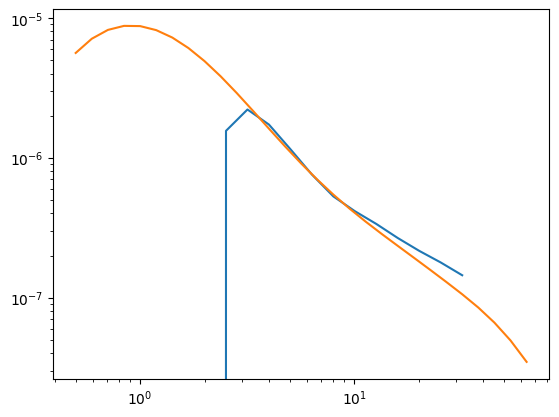

In [20]:
#plt.loglog(apradii,mn3[0][0].real, 'b-')
#plt.loglog(apradii,np.abs(mn3[0][0].imag), 'r-')
plt.loglog(apradii,9*3*mapnap3[0])
plt.loglog(napmap_fsky['R'][4:],3*dat_kkcorr_hr_rshift['nap2_ext'][::2]*napmap_mean[0,4:])

In [20]:
import treecorr
tcsources = treecorr.Catalog(x=sources.pos1, y=sources.pos2, g1=sources.tracer_1, g2=sources.tracer_2)
tclenses = treecorr.Catalog(x=lenses.pos1, y=lenses.pos2)

# Compute NapMap
tcng = treecorr.NGCorrelation(min_sep=min_sep, max_sep=max_sep, bin_size=0.1)
tcng.process(cat2=tcsources,cat1=tclenses)
tcnapmap = tcng.calculateNMap(R=apradii)

# ComputeNap2
dpix_arcmin = 1.
_max1 = max(sources.max1,lenses.max1)+dpix_arcmin
_max2 = max(sources.max2,lenses.max2)+dpix_arcmin
_min1 = min(sources.min1,lenses.min1)-dpix_arcmin
_min2 = min(sources.min2,lenses.min2)-dpix_arcmin
_len1 = _max1-_min1
_len2 = _max2-_min2
npix_x = int(np.ceil(_len1/dpix_arcmin))
npix_y = int(np.ceil(_len2/dpix_arcmin))

xpixs_sources = np.floor((sources.pos1-_min1)/_len1 * npix_x).astype(int)
ypixs_sources = np.floor((sources.pos2-_min2)/_len2 * npix_y).astype(int)
xpixs_lenses = np.floor((lenses.pos1-_min1)/_len1 * npix_x).astype(int)
ypixs_lenses = np.floor((lenses.pos2-_min2)/_len2 * npix_y).astype(int)
pixs_sources = ypixs_sources*npix_x + xpixs_sources
pixs_lenses = ypixs_lenses*npix_x + xpixs_lenses
sel_footprint = np.unique(np.append(pixs_sources,pixs_lenses))
meancounts = 1.5/fthin_lens *dpix_arcmin**2
idxs_lens, counts_lens = np.unique(pixs_lenses,return_counts=True)
delta_lens = -np.ones(npix_x*npix_y)
delta_lens[idxs_lens] = counts_lens/meancounts - 1

foot2d = np.zeros(npix_y*npix_x)
foot2d[sel_footprint.flatten()] += 1.
ys_dlens = np.argwhere(foot2d.flatten()==1).flatten()//npix_x * dpix_arcmin
xs_dlens = np.argwhere(foot2d.flatten()==1).flatten()%npix_x * dpix_arcmin
xs_dlens += dpix_arcmin*(np.random.rand(len(xs_dlens))-0.5)
ys_dlens += dpix_arcmin*(np.random.rand(len(xs_dlens))-0.5)

In [19]:
lenses.ngal/600/600

1.5311305555555554

In [21]:
tcdelta = treecorr.Catalog(x=xs_dlens, y=ys_dlens, k=delta_lens[foot2d.flatten()==1])
tcnn = treecorr.KKCorrelation(min_sep=min_sep, max_sep=max_sep, bin_size=0.1)
tcnn.process(tcdelta)
theta_edges = np.geomspace(tcnn.min_sep,tcnn.max_sep,len(tcnn.meanr)+1)
Tp = lambda x: 1./128. * (x**4-16*x**2+32) * np.exp(-x**2/4.)  
nap2 = np.zeros(len(apradii))
for elr, mapR in enumerate(apradii):
    _dr = theta_edges[1:]-theta_edges[:-1]
    nap2[elr] = np.sum(_dr*tcnn.meanr/(2*mapR**2) * Tp(tcnn.meanr/mapR) * tcnn.xi)
np.mean(tcdelta.k)

0.011949740957374501

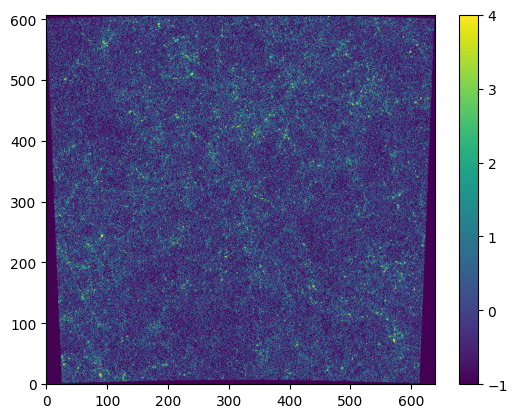

-0.05415705735386984

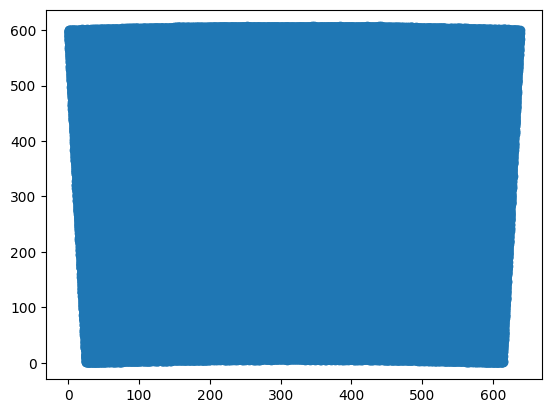

In [22]:
plt.imshow(delta_lens.reshape((npix_y,npix_x)),vmax=4,origin='lower')
plt.colorbar()
plt.show()

plt.scatter(x=xs_dlens,y=ys_dlens)
np.mean(delta_lens)

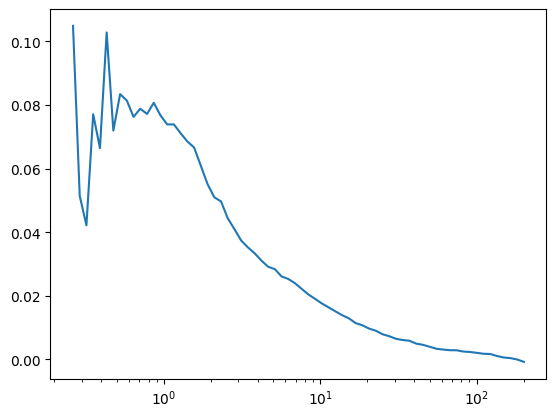

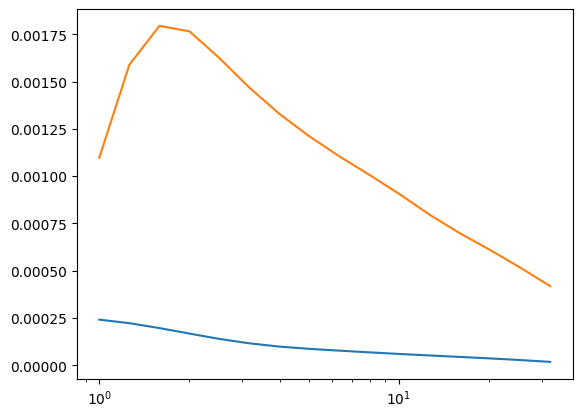

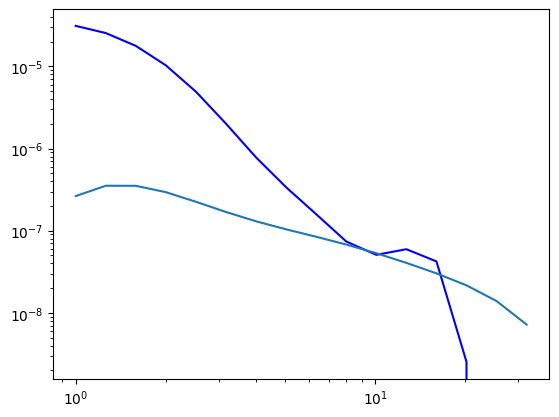

In [28]:
plt.semilogx(tcnn.meanr,tcnn.xi)
plt.show()
plt.semilogx(apradii, tcnapmap[0])
plt.semilogx(apradii, nap2)
plt.show()
plt.loglog(apradii,mn3[0][0].real, 'b-')
plt.loglog(apradii,tcnapmap[0]*nap2)
plt.show()

In [ ]:
lenses.create_mask(method='Density',pixsize=4)
direct_lenses  = orpheus.Direct_NapnEqual(order_max=3,Rmin=apradii[0],Rmax=apradii[-1],nbinsr=len(apradii),accuracies=8,ap_weights='Identity')
nap2 = direct_lenses.process(lenses, Nbar_policy=2, dpix_innergrid=4.)

Done 16/16 aperture radii

In [ ]:
import treecorr
tcsources = treecorr.Catalog(x=sources.pos1,  y=sources.pos2, g1=sources.tracer_1, g2=sources.tracer_2)
tclenses = treecorr.Catalog(x=lenses.pos1, y=lenses.pos2, k=lenses.weight)

ng = treecorr.NGCorrelation(min_sep=0.25,max_sep=150.,bin_size=0.1)
ng.process(cat2=tcsources,cat1=tclenses)
NapMap = ng.calculateNMap(R=apradii)

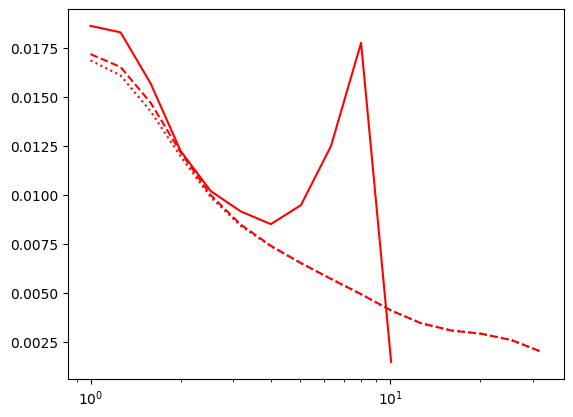

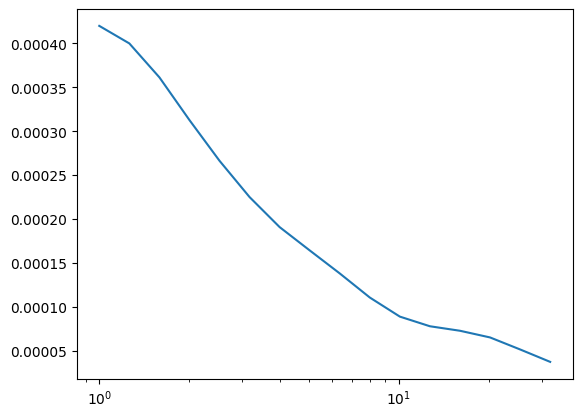

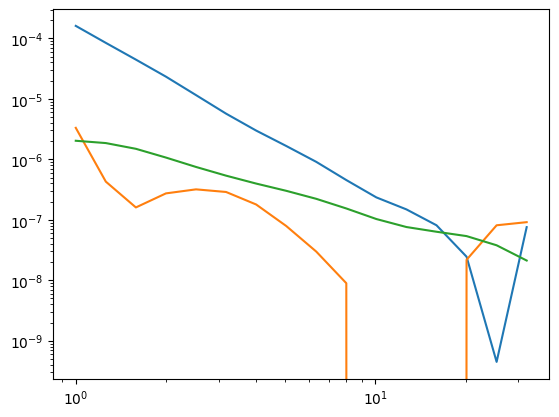

In [ ]:
nbar_global = 110242./600./600.
#plt.semilogx(direct_lenses.radii,nap2[0][:,0,0]/nbar_global,'b-')
#plt.semilogx(direct_lenses.radii,nap2[0][:,1,0]/nbar_global,'b-')
#plt.semilogx(direct_lenses.radii,nap2[0][:,2,0]/nbar_global,'b-')

plt.semilogx(apradii,nap2[0][:,0,1]/nbar_global**2,'r-')
plt.semilogx(apradii,nap2[0][:,1,1]/nbar_global**2,'r--')
plt.semilogx(apradii,nap2[0][:,2,1]/nbar_global**2,'r:')
plt.show()


plt.semilogx(apradii,NapMap[0].real)
plt.show()

plt.loglog(apradii,mn3[0][0].real)
plt.loglog(apradii,mn3[0][0].imag)
plt.semilogx(apradii,3*nap2[0][:,1,1]*NapMap[0].real)
plt.show()

## Computation of the shear-lens-lens-lens correlation function (many bins)

Similar to the other 4PCFs we provide a low-memory implementation that can be triggered by utilizing the `lowmem=True` parameter in the `process` method.

As a comparison we also compute the G4L aperture statistics using the direct estimator. Note that as this estimators weighs the data intrinsically different as compared to the 4PCF estimator, we do not expect perfect agreement, but the two curves should nevertheless trace each other. In the plots we further plot an individual line for each coveage cutoff which should give a hint of the expected spread between the two estimators.

In [ ]:
direct_sources = orpheus.Direct_MapnEqual(order_max=3,Rmin=apradii[0],Rmax=apradii[-1],nbinsr=len(apradii),accuracies=8,ap_weights='InvShot')
direct_lenses  = orpheus.Direct_NapnEqual(order_max=3,Rmin=apradii[0],Rmax=apradii[-1],nbinsr=len(apradii),accuracies=8,ap_weights='Identity')

lenses.min1 = min(sources.min1,lenses.min1)
sources.min1 = lenses.min1
lenses.max1 = max(sources.max2,lenses.max2)
sources.max1 = lenses.max2
lenses.min2 = min(sources.min2,lenses.min2)
sources.min2 = lenses.min2
lenses.max2 = max(sources.max2,lenses.max2)
sources.max2 = lenses.max2
sources.len1 = sources.max1-sources.min1
sources.len2 = sources.max2-sources.min2
lenses.len1 = lenses.max1-lenses.min1
lenses.len2 = lenses.max2-lenses.min2

sources.create_mask('Basic')
lenses.create_mask('Basic')

elR = 5
#nextnaps = direct_lenses.getnap(indR=elR, cat=lenses, dotomo=False)
nextmaps = direct_sources.getmap(indR=elR, cat=sources, dotomo=False)

: 

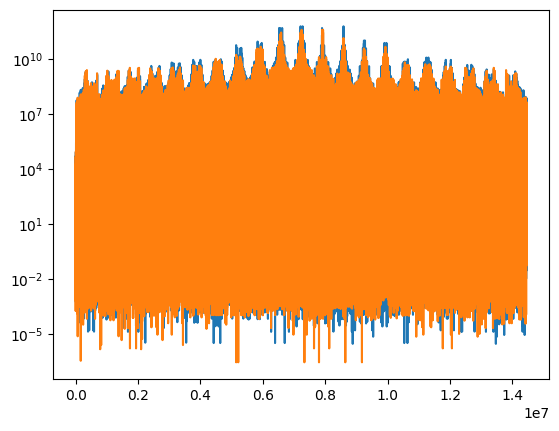

In [ ]:
plt.semilogy(np.abs(gnnn.npcf_multipoles.real.flatten()))
plt.semilogy(np.abs(gnnn.npcf_multipoles.imag.flatten()))
plt.show()

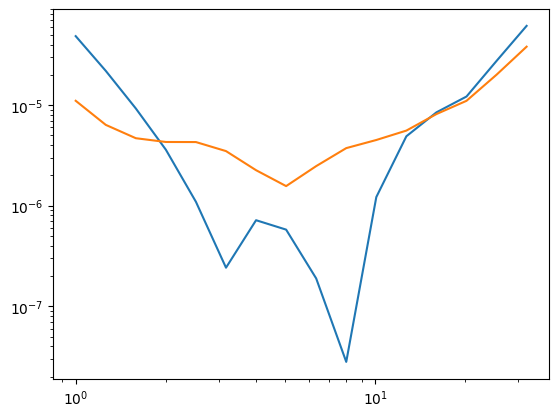

In [ ]:
plt.loglog(apradii,apradii**1.5*np.abs(mn3[0][0,0].real))
plt.loglog(apradii,apradii**1.5*np.abs(mn3[0][0,0].imag))

In [ ]:
np.abs(gnnn.npcf_multipoles)
gnnn.bin_centers
2*np.pi*gnnn.bin_centers_mean[11]*(gnnn.bin_edges[12]-gnnn.bin_edges[11])
gnnn.bin_centers_mean[12]
#sources.pix1_n*sources.pix2_n

IndexError: index 11 is out of bounds for axis 0 with size 1

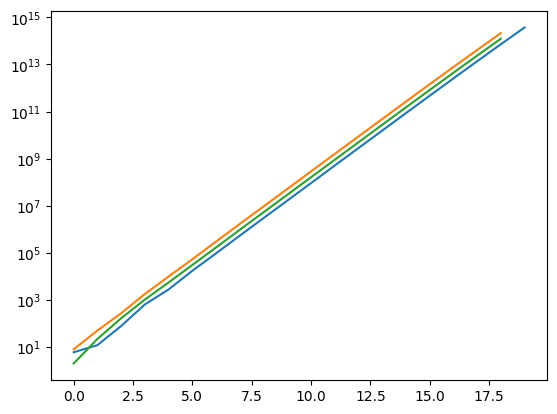

In [ ]:
plt.semilogy([gnnn.npcf_multipoles_norm[nmaxs,nmaxs,0,elr,elr,elr].real for elr in range(20)])
plt.semilogy([gnnn.npcf_multipoles_norm[nmaxs,nmaxs,0,elr+1,elr+1,elr].real for elr in range(19)])
plt.semilogy([gnnn.npcf_multipoles_norm[nmaxs,nmaxs,0,elr-1,elr-1,elr].real for elr in range(1,20)])

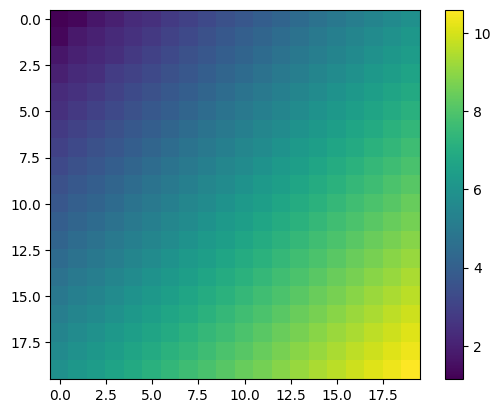

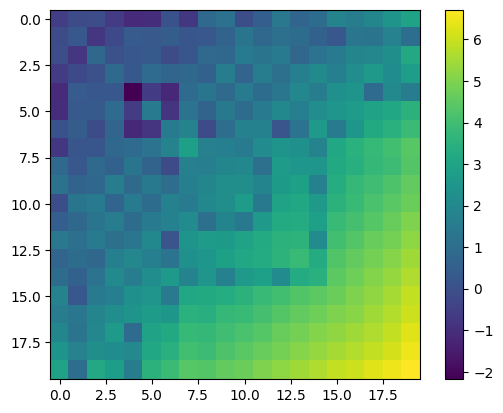

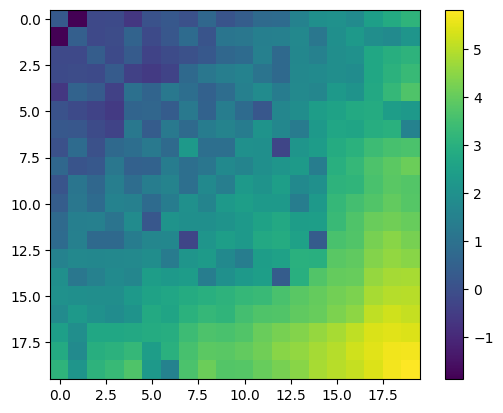

In [ ]:
plt.imshow(np.log10(gnnn.npcf_multipoles_norm[nmaxs,nmaxs,0,3].real))
plt.colorbar()
plt.show()
plt.imshow(np.log10(np.abs(gnnn.npcf_multipoles[0,nmaxs,nmaxs,0,7].real)))
plt.colorbar()
plt.show()
plt.imshow(np.log10(np.abs(gnnn.npcf_multipoles[0,nmaxs,nmaxs,0,7].imag)))
plt.colorbar()

In [ ]:
elr1 = 12
elr2 = 17
elr3 = 18
npcf_out, npcf_norm_out = gnnn.multipoles2npcf_singlethetcombi(elr1,elr2,elr3)

plt.imshow(npcf_out[0].real)
plt.colorbar()
plt.show()

plt.imshow(npcf_out[0].imag)
plt.colorbar()
plt.show()

plt.imshow(npcf_norm_out.real)
plt.colorbar()
plt.show()

plt.imshow(npcf_norm_out.imag)
plt.colorbar()
plt.show()

IndexError: index 12 is out of bounds for axis 0 with size 1

In [ ]:
def multipoles2npcf_singletheta_nconvergence(inst, elthet1, elthet2, elthet3):
    r""" Checks convergence of the conversion between mutltipole-space and real space for a combination of radial bins.

    Returns:
    --------
    npcf_out: np.ndarray
        Natural 4PCF components in the real-space basis for all angular combinations.
    npcf_norm_out: np.ndarray
        4PCF weighted counts in the real-space basis for all angular combinations.
    """
    
    _phis1 = inst.phis[0].astype(np.float64)
    _phis2 = inst.phis[1].astype(np.float64)
    _nphis1 = len(inst.phis[0])
    _nphis2 = len(inst.phis[1])
            
    ncfs, nnvals, _, nzcombis, nbinsr, _, _ = np.shape(inst.npcf_multipoles)
    
    Upsilon_in = inst.npcf_multipoles[...,elthet1,elthet2,elthet3].flatten()
    N_in = inst.npcf_multipoles_norm[...,elthet1,elthet2,elthet3].flatten()
    npcf_out = np.zeros(inst.n_cfs*nzcombis*(inst.nmaxs[0]+1)*(inst.nmaxs[1]+1)*_nphis1*_nphis2, dtype=np.complex128)
    npcf_norm_out = np.zeros(nzcombis*(inst.nmaxs[0]+1)*(inst.nmaxs[1]+1)*_nphis1*_nphis2, dtype=np.complex128)
    
    inst.clib.multipoles2npcf_gnnn_singletheta_nconvergence(
        Upsilon_in, N_in, inst.nmaxs[0], inst.nmaxs[1],
        inst.bin_centers_mean[elthet1], inst.bin_centers_mean[elthet2], inst.bin_centers_mean[elthet3],
        _phis1, _phis2, _nphis1, _nphis2,
        npcf_out, npcf_norm_out)
            
    npcf_out = npcf_out.reshape((inst.n_cfs, inst.nmaxs[0]+1, inst.nmaxs[1]+1, _nphis1, _nphis2))
    npcf_norm_out = npcf_norm_out.reshape((inst.nmaxs[0]+1, inst.nmaxs[1]+1, _nphis1, _nphis2))

    return npcf_out, npcf_norm_out
        
npcf_conv, npcf_norm_conv = multipoles2npcf_singletheta_nconvergence(gnnn, elr1,elr2,elr3)


Done 100.00 per cent

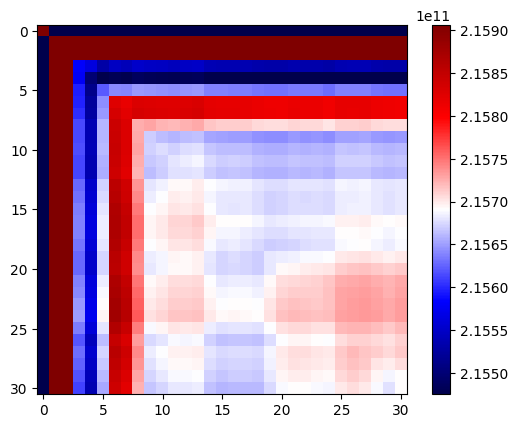

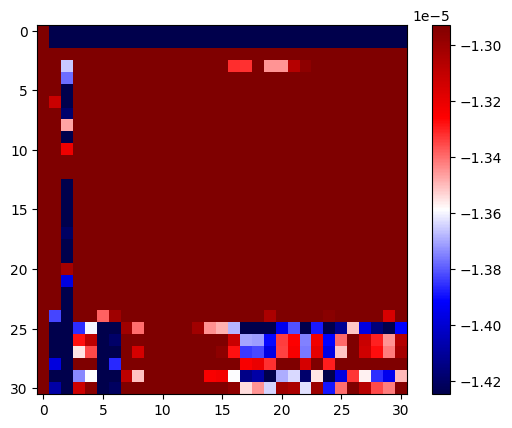

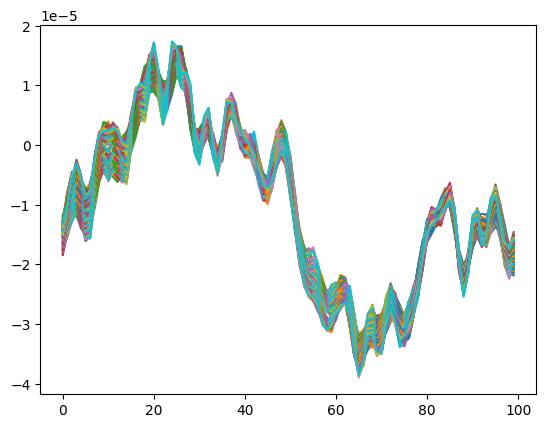

In [ ]:
elphi1 = 33
elphi2 = 51
_locut = .999
_hicut = 1.001
plt.imshow(npcf_norm_conv[:,:,elphi1,elphi2].real,vmin=_locut*npcf_norm_conv[-1,-1,elphi1,elphi2].real,vmax=_hicut*npcf_norm_conv[-1,-1,elphi1,elphi2].real,cmap='seismic')
plt.colorbar()
plt.show()

plt.imshow(npcf_conv[0,:,:,elphi1,elphi2].real,vmin=_locut*npcf_conv[0,-1,-1,elphi1,elphi2].real,vmax=_hicut*npcf_conv[0,-1,-1,elphi1,elphi2].real,cmap='seismic')
plt.colorbar()
plt.show()

for cut1 in range(20,nmaxs):
    for cut2 in range(20,nmaxs):
        plt.plot(npcf_conv[0,cut1,cut2,elphi1,:].real)

In [ ]:
gnn = orpheus.GNNCorrelation(min_sep=min_sep,max_sep=max_sep,binsize=binsize,nmaxs=10,method="Discrete",verbosity=1,nthreads=nthreads)
gnn.process(sources,lenses)

(1e-08, 5.126901953277891e-05)

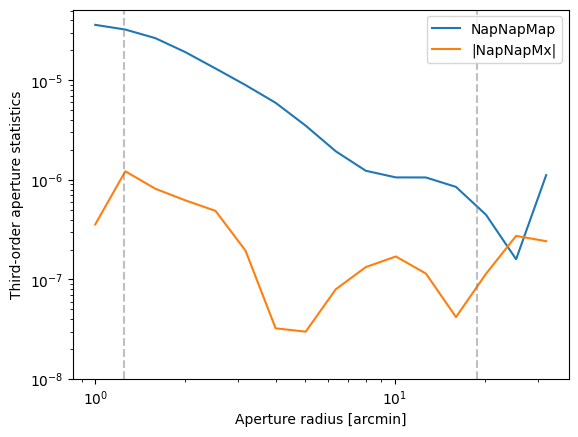

In [ ]:
gnn.multipoles2npcf()
NNM = gnn.computeNNM(apradii)
plt.loglog(apradii, NNM[0,0].real, label="NapNapMap")
plt.loglog(apradii, np.abs(NNM[0,0].imag), label="|NapNapMx|")
plt.axvline(x=5*gnn.min_sep, color="grey",alpha=0.5,ls="--")
plt.axvline(x=0.125*gnn.max_sep, color="grey",alpha=0.5,ls="--")
plt.xlabel("Aperture radius [arcmin]")
plt.ylabel("Third-order aperture statistics")
plt.legend(loc="upper right")
plt.ylim(1e-8,None)

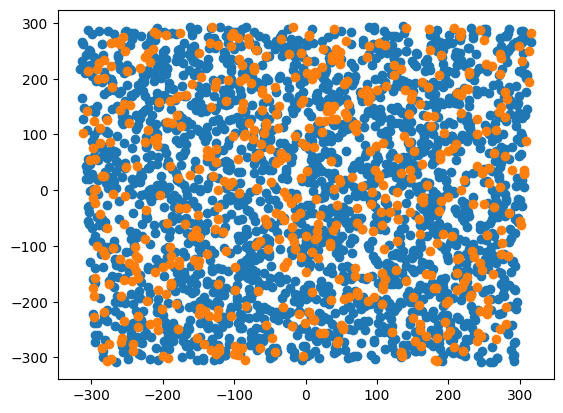

In [ ]:
plt.scatter(sources.pos1[::100],sources.pos2[::100])
plt.scatter(lenses.pos1[::100],lenses.pos2[::100])

In [ ]:
600*600/2/2

90000.0

In [ ]:
gnnn.tree_resos

array([0.  , 0.25, 0.5 , 1.  , 2.  ])

In [ ]:
import numpy as np
import sys
import gc
import orpheus

# Parameters

patch_divisor = 2
batch_run = 0
nthreads = 48

zlensbin = 1
zsourcebin = 8

min_sep = 0.25
max_sep = 150.
binsize = 0.15
nbinsphi = 100
nmaxs=15
method = "Tree"
tree_resos = [0,2]
apradii = np.geomspace(1,32,16)

fthin_source = 1
fthin_lens = 10

npatches = 1632
base_patches = "/vol/euclidraid4/data/lporth/HigherOrderLensing/Mocks/Takahashi/GLASS/data/Euclidlike/patches/"
base_save = "/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/data/GNNN_mocks/"

elpatch = 600
nextpatch = np.load(base_patches+"nside8192_real0_patch%i_linbias.npz"%(elpatch))
zsel_lenses = (nextpatch["zbin"] == zlensbin) * (nextpatch["isinner"]) # Only consider inner part of patch!
zsel_sources = (nextpatch["zbin"] == zsourcebin) * (nextpatch["isinner"]) # Only consider inner part of patch!

sources = orpheus.SpinTracerCatalog(spin=2,
                                    pos1=nextpatch["x"][zsel_sources][::fthin_source], 
                                    pos2=nextpatch["y"][zsel_sources][::fthin_source],
                                    tracer_1=nextpatch["gam1"][zsel_sources][::fthin_source],
                                    tracer_2=nextpatch["gam2"][zsel_sources][::fthin_source], 
                                    weight=None, zbins=None)
lenses = orpheus.ScalarTracerCatalog(pos1=nextpatch["x"][zsel_lenses][::fthin_lens], 
                                     pos2=nextpatch["y"][zsel_lenses][::fthin_lens], 
                                     tracer=np.ones_like(nextpatch["x"][zsel_lenses][::fthin_lens]), 
                                     weight=None, zbins=None)
print(lenses.ngal, sources.ngal)
gnnn = orpheus.GNNNCorrelation_NoTomo(min_sep=min_sep,max_sep=max_sep,binsize=binsize,nmaxs=nmaxs,nbinsphi=nbinsphi,
                                        tree_resos=tree_resos,method=method,verbosity=3,nthreads=nthreads)
gnnn.zweighting=None
mnnn = gnnn.process(sources, lenses, statistics=["4pcf_multipole",'MN3'], lowmem=True, apradii=apradii)

fpath_save = base_save + "t17mock_GNNN_patch%i"%(elpatch)

25705 273605


(1e-08, 0.00011884848614607214)

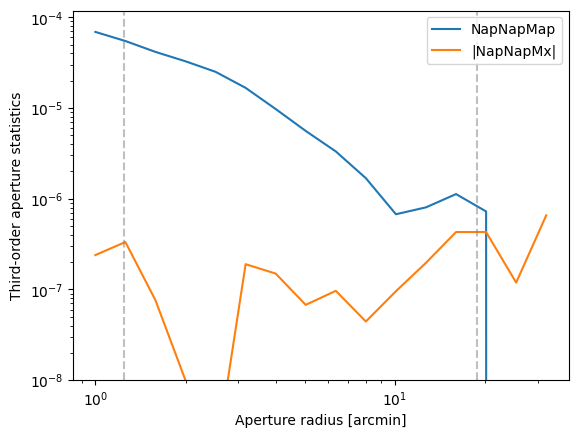

In [ ]:
gnn = orpheus.GNNCorrelation(min_sep=min_sep,max_sep=max_sep,binsize=binsize,nmaxs=nmaxs,nbinsphi=nbinsphi,
                                    tree_resos=tree_resos,method="DoubleTree",verbosity=1,nthreads=nthreads)
gnn.process(sources, lenses)
gnn.multipoles2npcf()
NNM = gnn.computeNNM(apradii)
plt.loglog(apradii, NNM[0,0].real, label="NapNapMap")
plt.loglog(apradii, np.abs(NNM[0,0].imag), label="|NapNapMx|")
plt.axvline(x=5*gnn.min_sep, color="grey",alpha=0.5,ls="--")
plt.axvline(x=0.125*gnn.max_sep, color="grey",alpha=0.5,ls="--")
plt.xlabel("Aperture radius [arcmin]")
plt.ylabel("Third-order aperture statistics")
plt.legend(loc="upper right")
plt.ylim(1e-8,None)

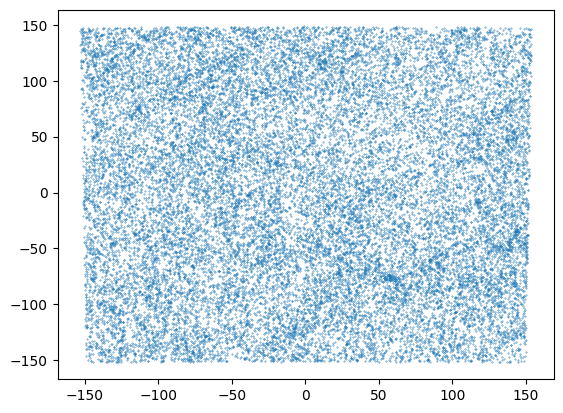

In [ ]:
from matplotlib import pyplot as plt

plt.scatter(lenses.pos1,lenses.pos2,s=0.1)

In [ ]:
dat = np.load("/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/data/GNNN_mocks/t17mock_GNNN_patch15.npz")

In [ ]:
dat.files

['apradii',
 'mnnn',
 'min_sep',
 'max_sep',
 'binsize',
 'nmaxs',
 'fthin_source',
 'fthin_lens',
 'Gtilde_n',
 'Norm_n']

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 

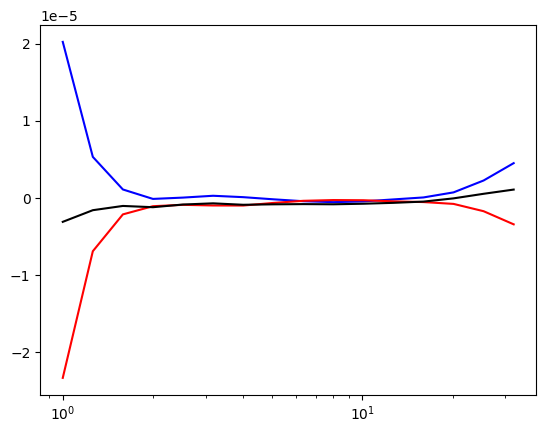

In [ ]:
mnn_mean = None
#Gn_tot = None
#Nn_tot = None
ndata = 0
for i in range(32):
    sys.stdout.write("%i "%i)
    try:
        dat = np.load("/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/data/GNNN_mocks/t17mock_GNNN_patch%i.npz"%i)
        if mnn_mean is None:
            mnn_mean = np.zeros_like(dat['mnnn'])
            #Gn_tot = np.zeros_like(dat['Gtilde_n'])
            #Nn_tot = np.zeros_like(dat['Norm_n'])
        mnn_mean += dat['mnnn']
        #Gn_tot += dat['Gtilde_n']
        #Nn_tot += dat['Norm_n']
        ndata += 1
    except:
        pass
    #plt.semilogx(dat['apradii'],dat['mnnn'][0,0].real,'b-')
    #plt.semilogx(dat['apradii'],dat['mnnn'][0,0].imag,'r-')
plt.semilogx(dat['apradii'],mnn_mean[0,0].real,'b-')
plt.semilogx(dat['apradii'],mnn_mean[0,0].imag,'r-')
plt.semilogx(dat['apradii'],mnn_mean[0,0].real+mnn_mean[0,0].imag,'k-')

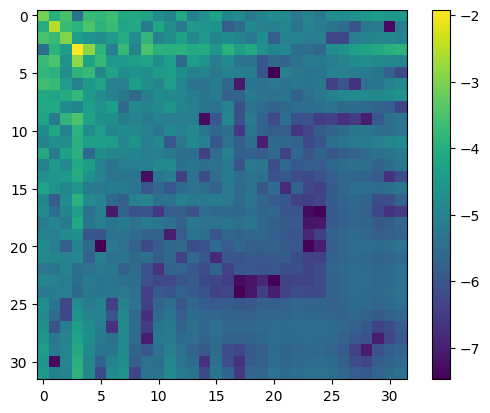

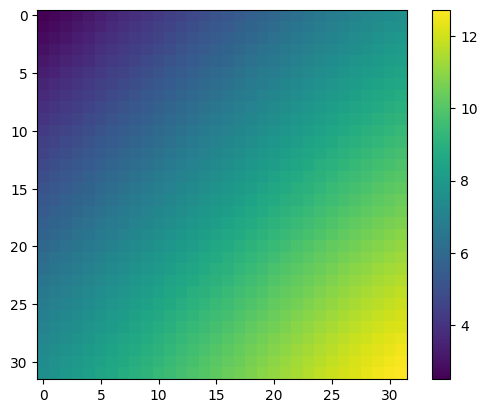

In [ ]:
plt.imshow(np.log10(np.abs(Gn_tot[0,10,10,0,3].real/Nn_tot[10,10,0,3].real)))
plt.colorbar()
plt.show()

plt.imshow(np.log10(np.abs(Nn_tot[10,10,0,3].real)))
plt.colorbar()
plt.show()

In [ ]:
gnnn = orpheus.GNNNCorrelation_NoTomo(min_sep=min_sep,max_sep=max_sep,binsize=binsize,nmaxs=nmaxs,nbinsphi=nbinsphi,
                                      tree_resos=tree_resos,method=method,verbosity=3,nthreads=nthreads)

In [ ]:
gnnn.bin_centers_mean = .5*(gnnn.bin_edges[1:]+gnnn.bin_edges[:-1])
gnnn.npcf_multipoles = Gn_tot
gnnn.npcf_multipoles_norm = Nn_tot

In [ ]:
elthet1 = 18
elthet2 = 18
elthet3 = 18

Gtilde_nconv, N_nconv = gnnn.multipoles2npcf_singletheta_nconvergence(elthet1=elthet1,elthet2=elthet2,elthet3=elthet3)


Done 98.30 per cent

Done 100.00 per cent

[10.14435613  5.56894344  3.05718083]


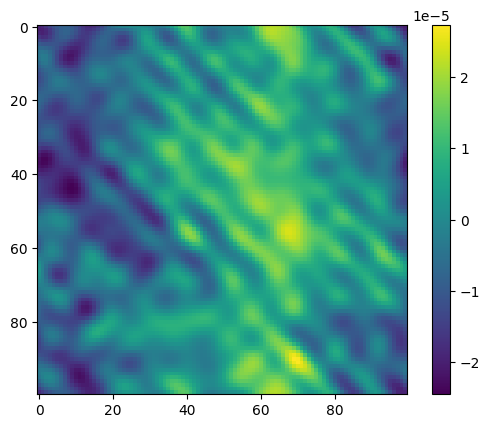

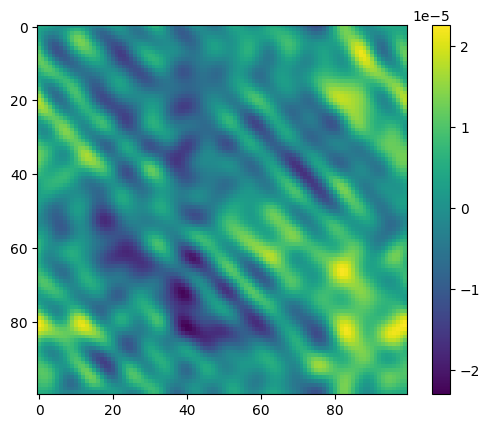

In [ ]:
print(gnnn.bin_centers_mean[[elthet1,elthet2,elthet3]])
plt.imshow(Gtilde_nconv[0,-1,-1].real)
plt.colorbar()
plt.show()
plt.imshow(Gtilde_nconv[0,-1,-1].imag)
plt.colorbar()
plt.show()

In [20]:
import numpy as np
import sys
import gc
import treecorr
import orpheus
from scipy.interpolate import interp1d
from matplotlib import pyplot as plt

# Parameters

patch_divisor = 2
batch_run = 0
nthreads = 48

zlensbin = 1
zsourcebin = 8

min_sep = 0.25
max_sep = 150.
binsize = 0.2
nbinsphi = 200
nmaxs=10
method = "Tree"
tree_resos = [0,0.5,1,2,4]
rmin_pixsize=40
apradii = np.geomspace(1,32,16)
fthin_source = 1
fthin_lens = 1

npatches = 1632

elpatch = 123
base_patches = "/vol/euclidraid4/data/lporth/HigherOrderLensing/Mocks/Takahashi/GLASS/data/Euclidlike/patches/"
nextpatch = np.load(base_patches+"nside8192_real0_patch%i_linbias.npz"%(elpatch))
zsel_lenses = (nextpatch["zbin"] == zlensbin)# * (nextpatch["isinner"])
zsel_sources = (nextpatch["zbin"] == zsourcebin) * (nextpatch["isinner"]) 
lensshuffle =  np.arange(np.sum(zsel_lenses))
sourceshuffle =  np.arange(np.sum(zsel_sources))
#np.random.shuffle(x=lensshuffle)
#np.random.shuffle(x=sourceshuffle)
orph_sources = orpheus.SpinTracerCatalog(spin=2,
                                        pos1=nextpatch["x"][zsel_sources][sourceshuffle][::fthin_source], 
                                        pos2=nextpatch["y"][zsel_sources][sourceshuffle][::fthin_source],
                                        tracer_1=nextpatch["gam1"][zsel_sources][sourceshuffle][::fthin_source],
                                        tracer_2=nextpatch["gam2"][zsel_sources][sourceshuffle][::fthin_source], 
                                        weight=None, zbins=None)
orph_lenses = orpheus.ScalarTracerCatalog(pos1=nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens], 
                                        pos2=nextpatch["y"][zsel_lenses][lensshuffle][::fthin_lens], 
                                        #isinner=nextpatch["isinner"][zsel_lenses][lensshuffle][::fthin_lens],
                                        tracer=np.ones_like(nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens]))
gnnnl = orpheus.GNNNCorrelation_NoTomo(min_sep=min_sep, max_sep=max_sep, binsize=binsize, nmaxs=nmaxs, nbinsphi=nbinsphi, 
                                      method=method, tree_resos=tree_resos, rmin_pixsize=rmin_pixsize, 
                                      verbosity=3, nthreads=nthreads)
gnnnl.zweighting=None
mn3l = gnnnl.process(orph_sources, orph_lenses, statistics=["4pcf_multipole"], lowmem=False) 

(0, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
4
(1, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (5,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[  0.25  20.    40.    80.   150.  ]
(2, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (273026,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1. 1. 1. ... 1. 1. 1.]
(3, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (273026,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1. 1. 1. ... 1. 1. 1.]
(4, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (273026,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[-136.94416809  151.50102234 -130.58209229 ...  -67.2019043    13.53226185
  -61.02030563]
(5, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (273026,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[ 127.55345917  123.93286133  122.835289   ... -147.93022156 -148.64367676
 -150.37559509]
(6, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (273026,), <class 'numpy.ctypeslib.n

In [21]:
mapnap3 = gnnn.computeMapNap3(apradii, nmax_trafo=None)
#mapnap3l = gnnnl.computeMapNap3(apradii, nmax_trafo=5)

 Done 100.00 per cent of Multipole to MN3 trafos.

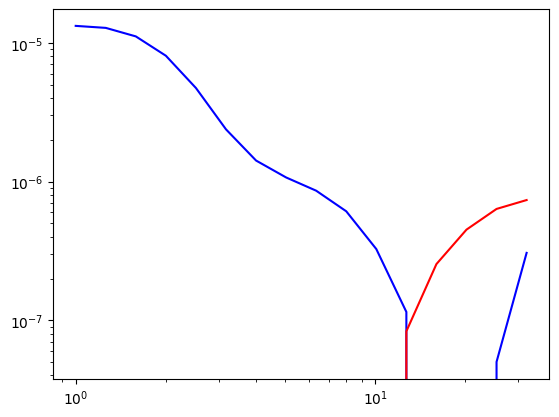

In [23]:
plt.loglog(apradii,mapnap3[0][0].real, 'b-')
plt.loglog(apradii,mapnap3[0][0].imag, 'r-')
#plt.loglog(apradii,np.abs(mn3l[0][0,0].real), 'c-')

#plt.loglog(apradii,mapnap3d[0][0].real, 'b--')
#plt.loglog(apradii,mapnap3d[0][0].imag, 'r--')

#plt.semilogx(apradii,-mapnap3_nmax5[0][0].real)


In [ ]:
gnnnt = orpheus.GNNNCorrelation_NoTomo(min_sep=min_sep,max_sep=max_sep,binsize=binsize,nmaxs=nmaxs, method="Tree",verbosity=3,nthreads=nthreads)
gnnnt.zweighting=None
gnnnt.process(orph_sources, orph_lenses, statistics=["4pcf_multipole", 'MN3'], lowmem=True, apradii=apradii) 

Using batchsize of 11 for radial bins
(0, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
5
(1, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (6,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[ 0.25  5.   10.   20.   40.   60.  ]
(2, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (273605,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1. 1. 1. ... 1. 1. 1.]
(3, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (273605,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1. 1. 1. ... 1. 1. 1.]
(4, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (273605,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[ 144.55853271  130.71224976   -1.02669585 ... -113.10105133   45.72911835
  -20.94306755]
(5, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (273605,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[ 111.9690094    83.61030579   78.08946991 ... -144.32762146 -146.49319458
   10.51164055]
(6, <class 'numpy.ndarray'>, <class 'numpy.float64'

(array([[[-1.11751687e-06-1.49950929e-06j,
          -5.60079552e-07-7.48040115e-07j,
          -3.99055847e-07-2.19333476e-07j,
          -2.49322070e-08-1.66469285e-07j,
           2.47601762e-07-1.84896882e-07j,
           3.40183468e-07-1.10175400e-07j,
           1.57225618e-07-2.07208591e-08j,
          -1.72683725e-07+5.69905397e-08j,
          -2.95171079e-07+1.32981919e-07j,
          -2.47305077e-07+2.20078091e-07j,
          -1.38126675e-07+2.88394426e-07j,
          -6.30779404e-08+4.33927420e-07j,
          -1.60905156e-07+7.73256910e-07j,
          -1.26945066e-07+1.05798431e-06j,
          -6.67605577e-08+7.56137511e-07j,
          -4.56758114e-08+2.26837633e-07j]]]),)

Done 100.00 per cent[2.45794106 2.45794106 2.45794106]


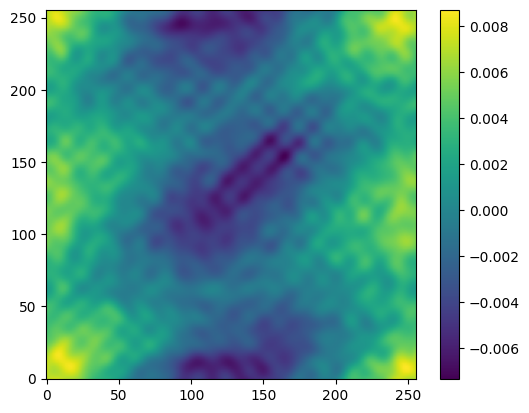

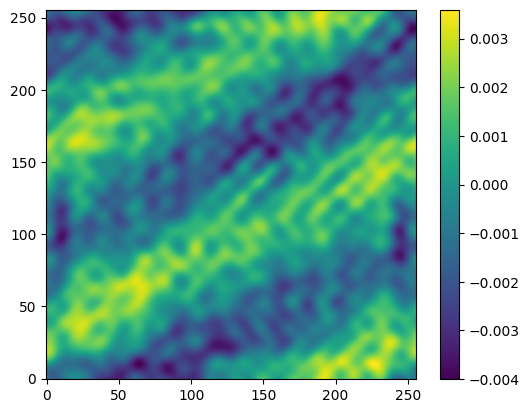

In [ ]:
elthet1 = 11
elthet2 = 11
elthet3 = 11

gnnn.bin_centers_mean = gnnn.bin_centers[0,0]
Gtilde_nconv, N_nconv = gnnn.multipoles2npcf_singletheta_nconvergence(elthet1=elthet1,elthet2=elthet2,elthet3=elthet3)
print(gnnn.bin_centers_mean[[elthet1,elthet2,elthet3]])
plt.imshow(Gtilde_nconv[0,-1,-1].real,origin='lower')
plt.colorbar()
plt.show()
plt.imshow(Gtilde_nconv[0,-1,-1].imag,origin='lower')
plt.colorbar()
plt.show()

In [ ]:
gnnnt.bin_centers_mean = gnnnt.bin_centers[0,0]

elthet1 = 11
elthet2 = 11
elthet3 = 11

Gtildet_nconv, Nt_nconv = gnnnt.multipoles2npcf_singletheta_nconvergence(elthet1=elthet1,elthet2=elthet2,elthet3=elthet3)
print(gnnnt.bin_centers_mean[[elthet1,elthet2,elthet3]])
plt.imshow(Gtildet_nconv[0,-1,-1].real,origin='lower')
plt.colorbar()
plt.show()
plt.imshow(Gtildet_nconv[0,-1,-1].imag,origin='lower')
plt.colorbar()
plt.show()

NameError: name 'gnnnt' is not defined

In [ ]:
import numpy as np
import sys
import gc
import treecorr
import orpheus
from scipy.interpolate import interp1d
from matplotlib import pyplot as plt


sources = treecorr.Catalog(x=nextpatch["x"][zsel_sources[sourceshuffle]][::fthin_source], 
                           y=nextpatch["y"][zsel_sources][sourceshuffle][::fthin_source],
                           g1=nextpatch["gam1"][zsel_sources][sourceshuffle][::fthin_source],
                           g2=nextpatch["gam2"][zsel_sources][sourceshuffle][::fthin_source])
lenses = treecorr.Catalog(x=nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens], 
                          y=nextpatch["y"][zsel_lenses][lensshuffle][::fthin_lens], 
                          k=np.ones_like(nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens]))


IndexError: boolean index did not match indexed array along dimension 0; dimension is 10724567 but corresponding boolean dimension is 273605

In [ ]:
olenses = orpheus.ScalarTracerCatalog(pos1=nextpatch["x"], 
                                     pos2=nextpatch["y"], 
                                     tracer=np.ones_like(nextpatch["x"]), 
                                     weight=None, zbins=None)
olenses.create_mask(method="Density",pixsize=1)

nrand = 50*lenses.nobj
rand_x = olenses.len1*np.random.rand(nrand) + olenses.min1
rand_y = olenses.len2*np.random.rand(nrand) + olenses.min2
ipixs1 = np.floor((rand_x-olenses.mask.start_1)/olenses.mask.dpix_1).astype(int)
ipixs2 = np.floor((rand_y-olenses.mask.start_2)/olenses.mask.dpix_2).astype(int)
infootprint = olenses.mask.data[ipixs2,ipixs1] == 0

lenses_rand = treecorr.Catalog(x=rand_x[infootprint],y=rand_y[infootprint])

In [ ]:
ng = treecorr.NGCorrelation(min_sep=0.25,max_sep=150.,bin_size=0.1)
ng.process(cat2=sources,cat1=lenses)
NapMap = ng.calculateNMap(R=apradii)

In [ ]:
nn = treecorr.NNCorrelation(min_sep=0.25,max_sep=150.,bin_size=0.1)
nr = treecorr.NNCorrelation(min_sep=0.25,max_sep=150.,bin_size=0.1)
rr = treecorr.NNCorrelation(min_sep=0.25,max_sep=150.,bin_size=0.1)
nn.process(lenses)
nr.process(lenses,cat2=lenses_rand)
rr.process(lenses_rand)
Nap2 = nn.calculateNapSq(R=apradii,rr=rr,dr=nr)

Done 100.00 per cent[21.70977851 26.46477095 11.9849366 ]


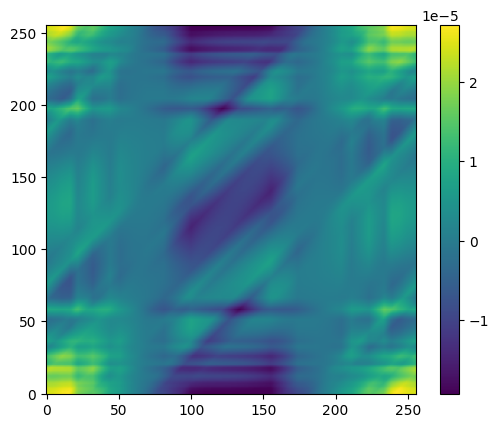

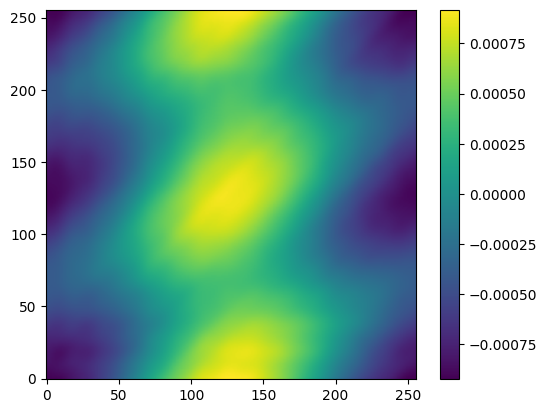

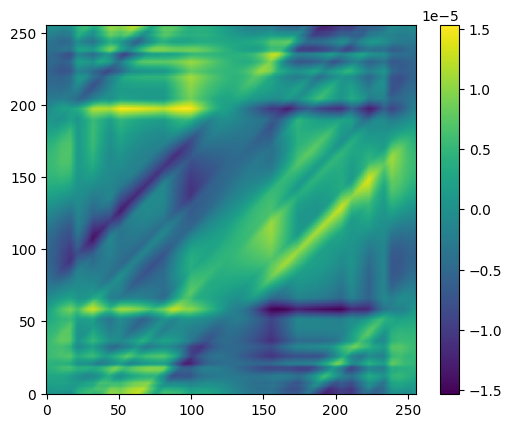

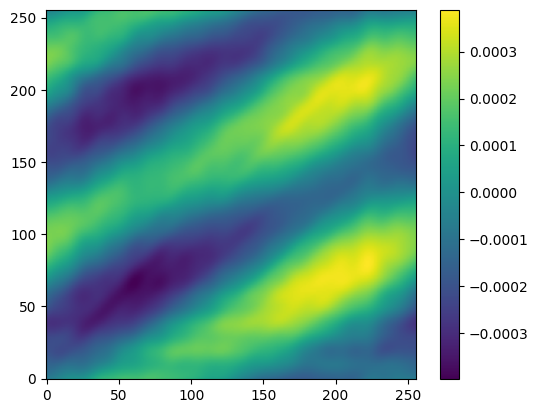

In [ ]:


elthet1 = 22
elthet2 = 23
elthet3 = 19
gnnn.bin_centers_mean = gnnn.bin_centers[0,0]
Gtilde_nconv, N_nconv = gnnn.multipoles2npcf_singletheta_nconvergence(elthet1=elthet1,elthet2=elthet2,elthet3=elthet3)

spl_nn = interp1d(nn.meanr,nn.xi,bounds_error=False,fill_value=0)
spl_ng = interp1d(nn.meanr,ng.xi,bounds_error=False,fill_value=0)
phi13, phi12 = np.meshgrid(gnnn.phis[0],gnnn.phis[1])
nggg_gauss = gtilde_gauss(spl_nn,spl_ng,gnnn.bin_centers_mean[elthet1],gnnn.bin_centers_mean[elthet2],gnnn.bin_centers_mean[elthet3],phi12,phi13)

print(gnnn.bin_centers_mean[[elthet1,elthet2,elthet3]])
plt.imshow(nggg_gauss.real,origin='lower')
plt.colorbar()
plt.show()
plt.imshow(-Gtilde_nconv[0,-1,-1].real,origin='lower')
plt.colorbar()
plt.show()

plt.imshow(nggg_gauss.imag,origin='lower')
plt.colorbar()
plt.show()
plt.imshow(-Gtilde_nconv[0,-1,-1].imag,origin='lower')
plt.colorbar()
plt.show()

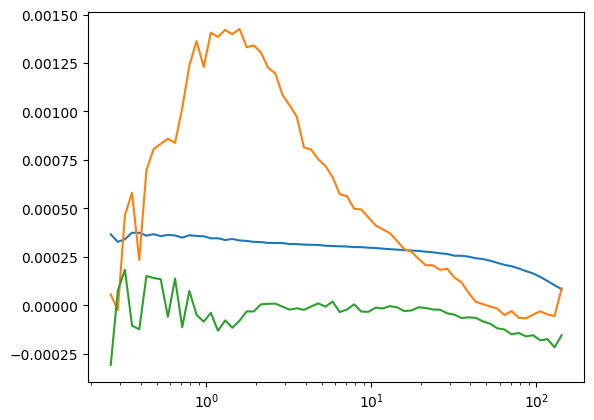

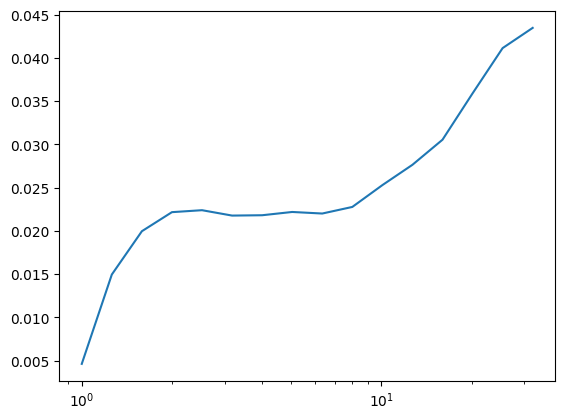

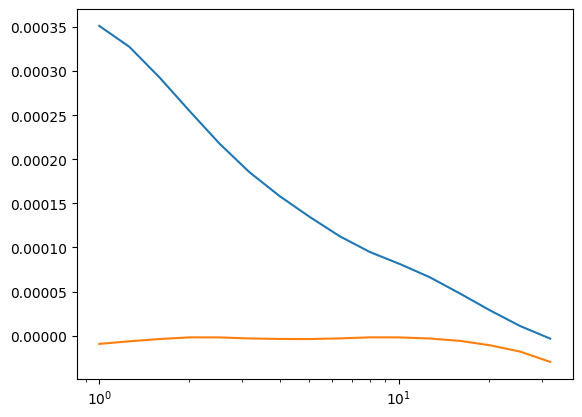

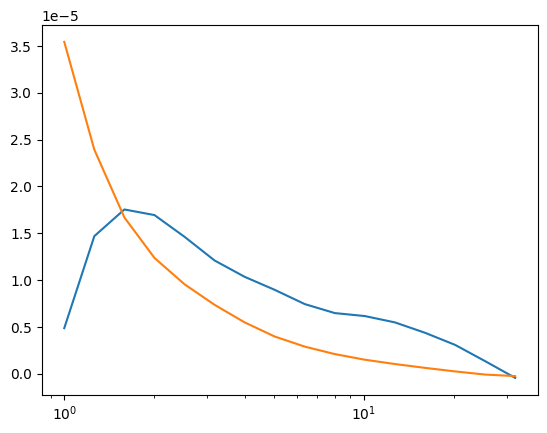

In [ ]:
plt.semilogx(nn.meanr,1e-4*nn.xi)
plt.semilogx(nn.meanr,ng.xi)
plt.semilogx(nn.meanr,ng.xi_im)

plt.show()
plt.semilogx(apradii,Nap2[0])
plt.show()
plt.semilogx(apradii,NapMap[0])
plt.semilogx(apradii,NapMap[1])
plt.show()
plt.semilogx(apradii,3*NapMap[0]*Nap2[0])
plt.semilogx(apradii,-mapnap3[0][0].real)

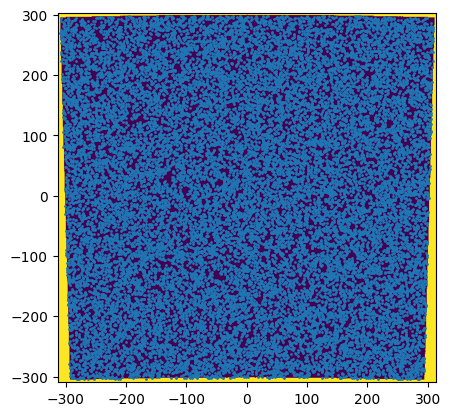

In [ ]:
plt.imshow(olenses.mask.data,origin='lower',
           extent=[olenses.mask.start_1,olenses.mask.start_1+olenses.mask.dpix_1*olenses.mask.npix_1,olenses.mask.start_2,olenses.mask.start_2+olenses.mask.dpix_2*olenses.mask.npix_2])
plt.scatter(rand_x[infootprint][::100],rand_y[infootprint][::100],s=1)

In [7]:
nextp3['bin_centers']/nextp['bin_centers']

array([[[1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         1.        , 1.        , 1.        , 1.        , 1.        ,
         0.99999873, 1.00001994, 0.99999425, 1.00000105, 1.00013603,
         1.00023946, 1.00002867, 1.00001273, 1.00039136, 1.00008824,
         1.0001098 , 1.00046447, 1.00070716, 1.00007294]]])

In [54]:
cumcenters *= patchmax/elp

In [57]:
nextp = np.load('/vol/euclidraid5/data/lporth/nonEuclid/G4LPaper/data/GNNN_mocks/t17mock_GNNN_Tree_patch%i.npz'%elp)

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276 27

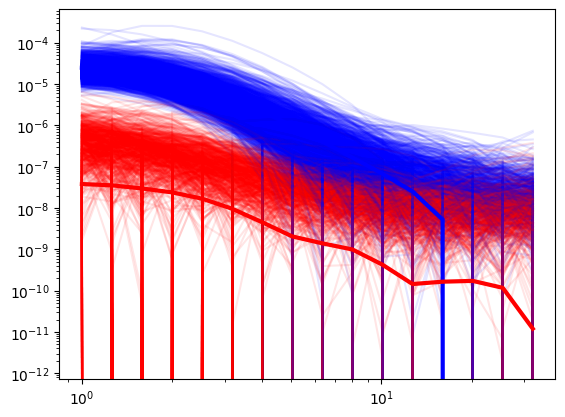

In [ ]:
import numpy as np
from matplotlib import pyplot as plt
import sys

fbase = "/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/data/"
paths_kkcorr_hr_rshift =  [fbase+"t17mock_2pcffromkappag_nside16384_zbin1_patch%i_4_randomshift42.npz"%(patch) for patch in range(1,5)]

for elp,p in enumerate(paths_kkcorr_hr_rshift):
    nextp = np.load(p)
    if elp==0:
        dat_kkcorr_hr_rshift = {}
        for k in nextp.files:
            dat_kkcorr_hr_rshift[k] = np.zeros_like(nextp[k])
    for k in nextp.files:
        dat_kkcorr_hr_rshift[k] += 1./len(paths_kkcorr_hr_rshift)*nextp[k][:]

allmnnn = None
patchmax = 1632
for elp in range(patchmax):
    sys.stdout.write("%i "%elp)
    nextp = np.load('/vol/euclidraid5/data/lporth/nonEuclid/G4LPaper/data/GNNN_mocks/t17mock_GNNN_Tree_patch%i.npz'%elp)
    nextp3 = np.load('/vol/euclidraid5/data/lporth/nonEuclid/G4LPaper/data/GNNN_mocks/t17mock_GNN_DoubleTree_patch%i.npz'%elp)
    plt.loglog(nextp['apradii'],nextp['mnnn'][0].real,'b-',alpha=0.1)
    plt.loglog(nextp['apradii'],nextp['mnnn'][0].imag,'r-',alpha=0.1)
    if elp==0:
        allmnnn = np.zeros((patchmax,*nextp['mnnn'][0].shape),dtype=complex)
        cumGn3 = np.zeros_like(nextp3['Gtilde_n'])
        cumNn3 = np.zeros_like(nextp3['Norm_n'])
        cumGn = np.zeros_like(nextp['Gtilde_n'])
        cumNn = np.zeros_like(nextp['Norm_n'])
        cumcenters = np.zeros_like(nextp['bin_centers'])
    allmnnn[elp] += nextp['mnnn'][0]
    cumGn += nextp['Gtilde_n']
    cumNn += nextp['Norm_n']
    cumGn3 += nextp3['Gtilde_n']
    cumNn3 += nextp3['Norm_n']
    cumcenters += 1./(patchmax) * nextp['bin_centers']
napmap_fsky = np.load("/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/data/Mocks_NG_zlens1_zsource8.npz")
napmap_mean = np.mean(napmap_fsky["NG"][:patchmax],axis=0)
plt.loglog(nextp['apradii'],np.mean(allmnnn,axis=0).real,'b-',lw=3)
plt.loglog(nextp['apradii'],np.abs(np.mean(allmnnn,axis=0).imag),'r-',lw=3)

In [142]:
patchmax_corrs = 145
for elp in range(patchmax_corrs):
    sys.stdout.write("%i "%elp)
    nextpcorr = np.load('/vol/euclidraid5/data/lporth/nonEuclid/G4LPaper/data/GNNN_mocks/t17mock_NN_NNN_DoubleTree_patch%i_fthin1_nbarraid=100.00.npz'%elp)
    if elp==0:
        allxi2pt = np.zeros((patchmax_corrs,*nextpcorr['xi_2pt'].shape),dtype=float)
        allxi2ptLS = np.zeros((patchmax_corrs,*nextpcorr['xi_2pt_LS'].shape),dtype=float)
        allxi3ptSS = np.zeros((patchmax_corrs,*nextpcorr['xi_3pt_SS'].shape),dtype=float)
        allxi3ptJB = np.zeros((patchmax_corrs,*nextpcorr['xi_3pt_JB'].shape),dtype=float)
        cumNN = np.zeros_like(nextpcorr['NN'],dtype=float)
        cumNNNn = np.zeros_like(nextpcorr['NNN_n'],dtype=complex)
        cumcenters_corrs = np.zeros_like(nextpcorr['bin_centers'])
    allxi2pt[elp] += 1*nextpcorr['xi_2pt']
    allxi2ptLS[elp] += 1*nextpcorr['xi_2pt_LS']
    allxi3ptSS[elp] += 1*nextpcorr['xi_3pt_SS']
    allxi3ptJB[elp] += 1*nextpcorr['xi_3pt_JB']
    cumNN += nextpcorr['NN']
    cumNNNn += nextpcorr['NNN_n']
    cumcenters_corrs += 1./patchmax_corrs * nextpcorr['bin_centers']
    renorm_DR=100./3.
    cumxi2ptLS = renorm_DR**2*cumNN[0]/cumNN[3] - renorm_DR*(cumNN[1]+cumNN[2])/cumNN[3] + 1

corrnnn = orpheus.GGGCorrelation(n_cfs=4,min_sep=float(nextpcorr['min_sep']), max_sep=float(nextpcorr['max_sep']), binsize=float(nextpcorr['binsize']), 
                                         nmaxs=int(nextpcorr['nmaxs']), nbinsphi=int(nextpcorr['nbinsphi']),
                                         method="Tree", verbosity=3, nthreads=54)
corrnnn.bin_centers_mean = cumcenters_corrs
corrnnn.npcf_multipoles_norm = cumNNNn
corrnnn.npcf_multipoles = np.array([np.ones_like(cumNNNn),np.ones_like(cumNNNn),np.ones_like(cumNNNn),np.ones_like(cumNNNn)])
corrnnn.nbinsz = 2
corrnnn.multipoles2npcf()
footxi3ptSS = renorm_DR**3/corrnnn.npcf_norm[7].real * (corrnnn.npcf_norm[0].real - np.sum(corrnnn.npcf_norm[[1,2,4]],axis=0).real/renorm_DR + np.sum(corrnnn.npcf_norm[[3,5,6]],axis=0).real/renorm_DR**2 - corrnnn.npcf_norm[7].real/renorm_DR**3)



0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 

In [172]:
def gen_3ptcorr(inst, itheta1 ,itheta2, itheta3, instcorr3, instcorr2, corr3):
    _phis12,_phis13 = np.meshgrid(inst.phis[0],inst.phis[0])
    _ctheta1 = inst.bin_centers_mean[itheta2]*np.exp(1J*_phis12) - inst.bin_centers_mean[itheta1]
    _ctheta2 = inst.bin_centers_mean[itheta3]*np.exp(1J*_phis13) - inst.bin_centers_mean[itheta1]
    _cthetbins1 = np.digitize(np.abs(_ctheta1),instcorr3.bin_edges)
    _cthetbins2 = np.digitize(np.abs(_ctheta2),instcorr3.bin_edges)
    _cphibins12 = np.digitize(np.angle(_ctheta2-_ctheta1),instcorr3.phis[0])
    return corr3[_cthetbins1,_cthetbins2,_cphibins12]

itheta1 = 10; itheta2=10; itheta3=11
testcorr3 = gen_3ptcorr(inst=cumgnnn, itheta1=itheta1 ,itheta2=itheta2, itheta3=itheta3, instcorr3=corrnnn, instcorr2=None, corr3=footxi3ptSS)

In [168]:
%%time
import orpheus
apradii = np.geomspace(1,32,16)
cumgnnn = orpheus.GNNNCorrelation_NoTomo(min_sep=float(nextp['min_sep']), max_sep=float(nextp['max_sep']), binsize=float(nextp['binsize']), 
                                         nmaxs=int(nextp['nmaxs']), nbinsphi=int(nextp['nbinsphi']),
                                         method="Tree", verbosity=3, nthreads=54)
cumgnnn.bin_centers_mean = nextp3['bin_centers'][0,0]
cumgnnn.npcf_multipoles = cumGn
cumgnnn.npcf_multipoles_norm = cumNn
cumgnnn.projection = "X"

cumgnn = orpheus.GNNCorrelation(min_sep=float(nextp3['min_sep']), max_sep=float(nextp3['max_sep']), binsize=float(nextp3['binsize']), 
                                         nmaxs=int(nextp3['nmaxs']), nbinsphi=int(nextp3['nbinsphi']),
                                         method="DoubleTree", verbosity=3, nthreads=54)
cumgnn.bin_centers_mean = nextp3['bin_centers'][0,0]
cumgnn.npcf_multipoles = cumGn3
cumgnn.npcf_multipoles_norm = cumNn3
cumgnn.projection = "X"
cumgnn.nbinsz_source = 1
cumgnn.nbinsz_lens = 1
cumgnn.multipoles2npcf()
#cummnnn = cumgnnn.computeMapNap3(apradii)

from scipy.interpolate import interp1d
xinn_spl = interp1d(x=dat_kkcorr_hr_rshift['thetas'],y=1*dat_kkcorr_hr_rshift['kkcorr_ext'], bounds_error=False,fill_value=0)
xing_spl = interp1d(x=np.mean(napmap_fsky['bin_centers'],axis=0),y=np.mean(napmap_fsky['xi_ng'],axis=0), bounds_error=False,fill_value=0)
xing_at_centers = xing_spl(cumgnnn.bin_centers_mean)

CPU times: user 145 ms, sys: 1.4 ms, total: 146 ms
Wall time: 146 ms


In [68]:
%%time
# Get GNNN_disc over ensemble from 2pt
mapnap3_gauss = cumgnnn.MapNap3analytic(mapradii=apradii, xing_spl=xing_spl, xinn_spl=xinn_spl, thetamin_xi=0.025, thetamax_xi=250., ntheta_xi=50000, nsubr=2)
#mapnap3_gauss_4 = cumgnnn.MapNap3analytic(mapradii=apradii, xing_spl=xing_spl, xinn_spl=xinn_spl, thetamin_xi=0.025, thetamax_xi=250., ntheta_xi=50000, nsubr=4)
#mapnap3_gauss_6 = cumgnnn.MapNap3analytic(mapradii=apradii, xing_spl=xing_spl, xinn_spl=xinn_spl, thetamin_xi=0.025, thetamax_xi=250., ntheta_xi=50000, nsubr=6)

Using batchsize of 727 for radial bins
(0, <class 'numpy.float64'>, <class 'ctypes.c_double'>)
0.25
(1, <class 'numpy.float64'>, <class 'ctypes.c_double'>)
210.0
(2, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
34
(3, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (256,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[0.01227185 0.03681554 0.06135923 0.08590292 0.11044662 0.13499031
 0.159534   0.18407769 0.20862139 0.23316508 0.25770877 0.28225246
 0.30679616 0.33133985 0.35588354 0.38042724 0.40497093 0.42951462
 0.45405831 0.47860201 0.5031457  0.52768939 0.55223308 0.57677678
 0.60132047 0.62586416 0.65040785 0.67495155 0.69949524 0.72403893
 0.74858262 0.77312632 0.79767001 0.8222137  0.84675739 0.87130109
 0.89584478 0.92038847 0.94493217 0.96947586 0.99401955 1.01856324
 1.04310694 1.06765063 1.09219432 1.11673801 1.14128171 1.1658254
 1.19036909 1.21491278 1.23945648 1.26400017 1.28854386 1.31308755
 1.33763125 1.36217494 1.38671863 1.41126232 1.43580602 1.46034971

In [69]:
%%time
mapnap3_corr_second = cumgnnn.MapNap3_corrections(
    apradii=apradii, xi_ng=xing_at_centers, Gtilde_third=cumgnn.npcf, include_second=True, include_third=False)
mapnap3_corr_third = cumgnnn.MapNap3_corrections(
    apradii=apradii, xi_ng=xing_at_centers, Gtilde_third=cumgnn.npcf, include_second=False, include_third=True)

(0, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (35,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[  0.25         0.30475316   0.37149796   0.45286072   0.55204295
   0.67294734   0.82033132   0.99999426   1.21900566   1.48598333
   1.81143248   2.20815912   2.69177392   3.28130647   3.99995411
   4.87599468   5.94389922   7.24568837   8.83258582  10.7670339
  13.12515058  15.99972466  19.50386684  23.7754605   28.98258724
  35.33014063  43.06788853  52.50030116  63.99853152  78.01501984
  95.10129648 115.92968394 141.31975184 172.27056593 210.        ]
(1, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (34,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[  0.27827546   0.33922336   0.41351676   0.5040846    0.61447955
   0.74906574   0.91311728   1.1131038    1.35688642   1.65406191
   2.01632272   2.45791978   2.99623465   3.6524483    4.45238015
   5.42750828   6.61619972   8.06523073   9.83162254  11.98485819
  14.6096918   17.80939344  21.7098667   26.

In [27]:
#gnnn_nconv[0].shape, gnnn[0].shape

(array([20735.,  8611.,  1545.,  8739.,  8436.,  5196.,   174.,  3570.,
         5611.,  2919.]),
 array([-1.52565604e-04,  9.51588799e-05,  3.42883364e-04,  5.90607848e-04,
         8.38332332e-04,  1.08605682e-03,  1.33378130e-03,  1.58150578e-03,
         1.82923027e-03,  2.07695475e-03,  2.32467924e-03]),
 <BarContainer object of 10 artists>)

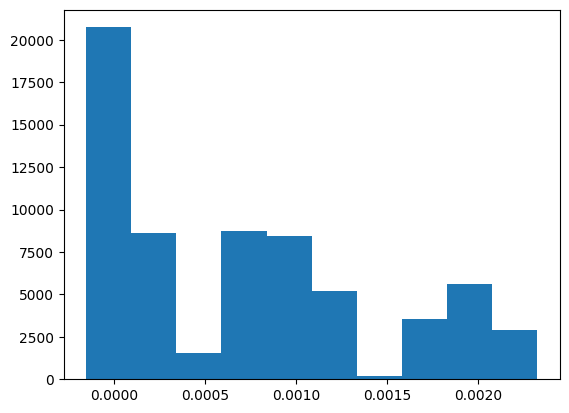

In [192]:
gnnn = cumgnnn.multipoles2npcf_singlethetcombi(elthet1=itheta1,elthet2=itheta2,elthet3=itheta3)
np.max(gnnn[0][0].real)
gnnn[0][0] = gnnn[0][0]*(1+gnnn_3ptcorr)
np.max(gnnn[0][0][0,0].real), np.max(gnnn[0][0]*(1+gnnn_3ptcorr))
plt.hist(gnnn_3ptcorr.real.flatten())

[26.46201472 26.46201472 32.25734602]


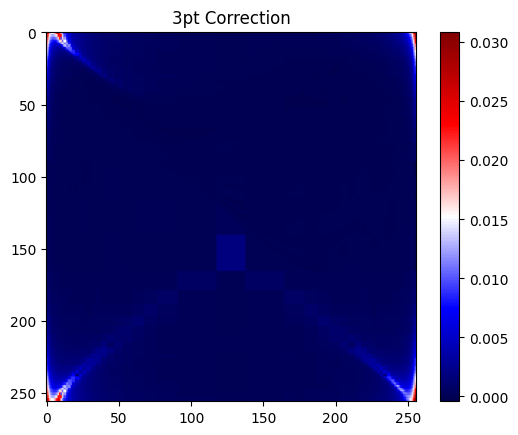

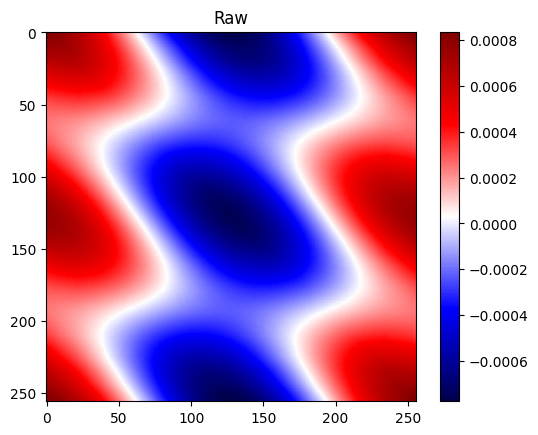

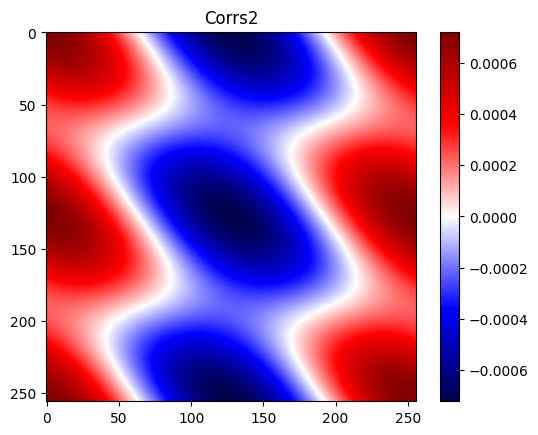

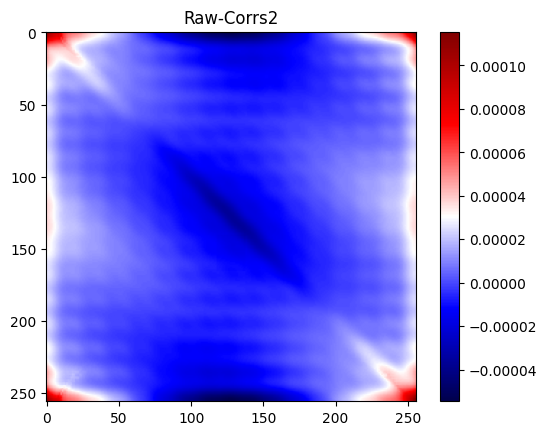

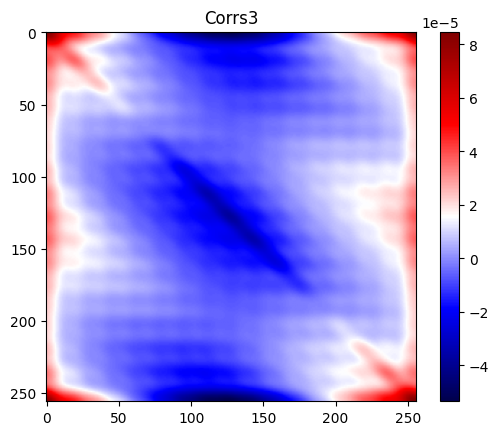

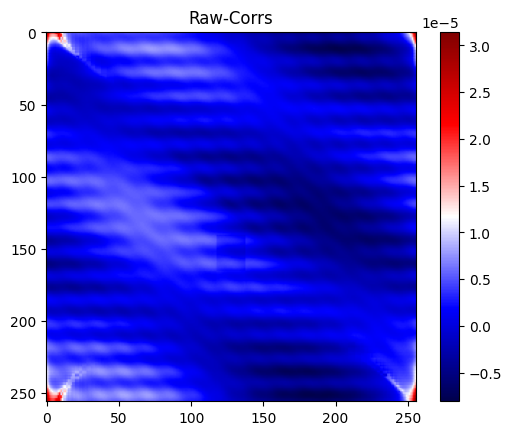

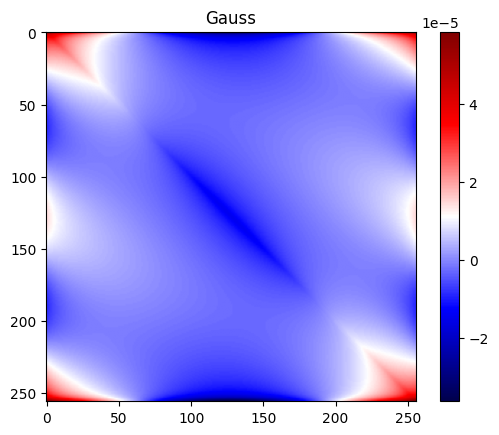

In [199]:
# Compare gaussian 4pcf and correstions to it
itheta1=23; itheta2=23; itheta3=24; nsubr=4
thetamin_xi = 0.25
thetamax_xi = 250.
dtheta_xi = 0.001
_thetaarr = np.arange(thetamin_xi,thetamax_xi,dtheta_xi)
print(cumgnnn.bin_centers_mean[[itheta1,itheta2,itheta3]])
nrec = 10
if _i1 is not itheta1 or _i2 is not itheta2 or _i3 is not itheta3:
    #gnnn_nconv = cumgnnn.multipoles2npcf_singletheta_nconvergence(elthet1=itheta1,elthet2=itheta2,elthet3=itheta3)
    _i1 = itheta1; _i2=itheta2; _i3=itheta3
xing_at_centers = xing_spl(1.0*cumgnnn.bin_centers_mean)
gnnn_analytic = cumgnnn.gauss4pcf_analytic(
    itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, nsubr=nsubr, 
    xing_arr=xing_spl(_thetaarr), xinn_arr=xinn_spl(_thetaarr), thetamin_xi=thetamin_xi, thetamax_xi=thetamax_xi, dtheta_xi=dtheta_xi)
gnnn = cumgnnn.multipoles2npcf_singlethetcombi(elthet1=itheta1,elthet2=itheta2,elthet3=itheta3)
gnnn_3ptcorr = gen_3ptcorr(inst=cumgnnn, itheta1=itheta1 ,itheta2=itheta2, itheta3=itheta3, instcorr3=corrnnn, instcorr2=None, corr3=footxi3ptSS)
gnnn[0][0] = gnnn[0][0]*(1+gnnn_3ptcorr)
gnnn_corrs2 = cumgnnn.gnnn_corrections(itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, xi_ng=xing_at_centers, 
                                       Gtilde_third=cumgnn.npcf, include_second=True, include_third=False)
gnnn_corrs3 = cumgnnn.gnnn_corrections(itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, xi_ng=xing_at_centers, 
                                       Gtilde_third=cumgnn.npcf, include_second=False, include_third=True)
gnnn_corrs = cumgnnn.gnnn_corrections(itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, xi_ng=xing_at_centers, 
                                      Gtilde_third=cumgnn.npcf, include_second=True, include_third=True)


plt.imshow(gnnn_3ptcorr,cmap='seismic')
plt.colorbar()
plt.title("3pt Correction")
plt.show()

plt.imshow(gnnn[0][0].real,cmap='seismic')
plt.colorbar()
plt.title("Raw")
plt.show()

plt.imshow(gnnn_corrs2[0].real,cmap='seismic')
plt.colorbar()
plt.title("Corrs2")
plt.show()

plt.imshow(gnnn[0][0].real-gnnn_corrs2[0].real,cmap='seismic')
plt.title("Raw-Corrs2")
plt.colorbar()
plt.show()

plt.imshow(gnnn_corrs3[0].real,cmap='seismic')
plt.colorbar()
plt.title("Corrs3")
plt.show()

plt.imshow(gnnn[0][0].real-gnnn_corrs[0].real,cmap='seismic')
plt.title("Raw-Corrs")
plt.colorbar()
plt.show()

plt.imshow(gnnn_analytic[0].real,cmap='seismic')
plt.title("Gauss")
plt.colorbar()
plt.show()

#plt.imshow(gnnn_nconv[0][0,nrec,nrec].real-gnnn[0][0].real,cmap='seismic')
#plt.title("raw (ncut=%i)-raw (noncut)"%nrec)
#plt.colorbar()
#plt.show()

/users/lporth/anaconda3/envs/orpheus_devel/lib/python3.12/site-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/users/lporth/anaconda3/envs/orpheus_devel/lib/python3.12/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


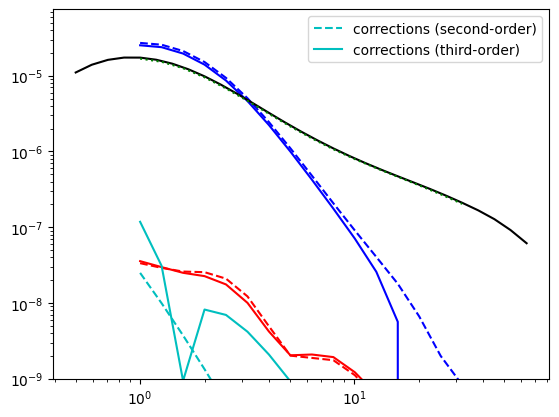

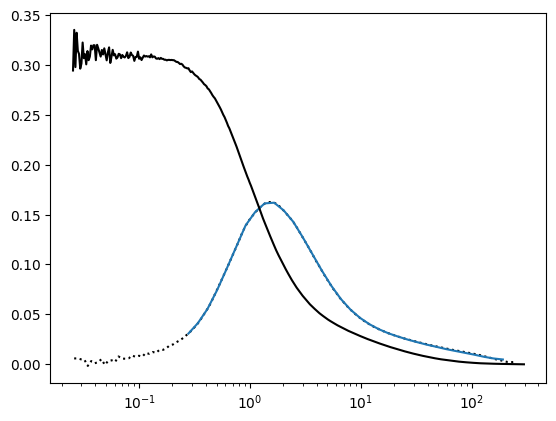

/tmp/ipykernel_447371/416793937.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


Text(0, 0.5, 'MNNN')

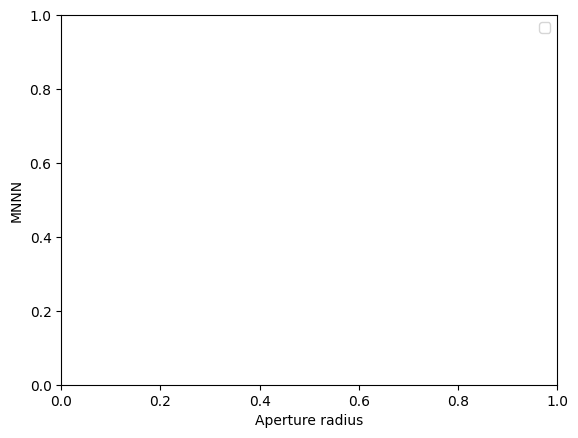

In [76]:
plt.loglog(nextp['apradii'],np.mean(allmnnn[:elp],axis=0).real,'b-')
plt.loglog(nextp['apradii'],np.abs(np.mean(allmnnn[:elp],axis=0).imag),'r-')
plt.semilogx(nextp['apradii'],cummnnn[0][0].real,'b--')
plt.semilogx(nextp['apradii'],np.abs(cummnnn[0][0].imag),'r--')
plt.semilogx(napmap_fsky['R'][4:], 6*dat_kkcorr_hr_rshift['nap2_ext'][::2]*napmap_mean[0,4:],'k-',)
plt.loglog(nextp['apradii'],mapnap3_corr_second[0],'c--',label="corrections (second-order)")
plt.loglog(nextp['apradii'],np.abs(mapnap3_corr_third[0]),'c-',label="corrections (third-order)")
plt.loglog(nextp['apradii'],mapnap3_gauss[0][0], 'g:')
plt.ylim(1e-9,None)
plt.legend()
plt.show()

plt.semilogx(np.mean(napmap_fsky['bin_centers'],axis=0), 1e2*np.mean(napmap_fsky['xi_ng'],axis=0),'k:')
plt.semilogx(cumgnnn.bin_centers_mean,1e2*xing_at_centers)
plt.semilogx(dat_kkcorr_hr_rshift['thetas'], dat_kkcorr_hr_rshift['kkcorr'],'k-')
plt.show()

#plt.loglog(nextp['apradii'],mapnap3_gauss[0][0],'b--',label="gauss")
#plt.loglog(nextp['apradii'],-mapnap3_gauss_4[0][0],'g-.',label="nsubr=4")
#plt.loglog(nextp['apradii'],-mapnap3_gauss_6[0][0],'g-',label="nsubr=6")


plt.legend()
plt.xlabel("Aperture radius")
plt.ylabel("MNNN")

In [ ]:
nextp.files
Gtilden = nextp['Gtilde_n']
Normn = nextp['Norm_n']

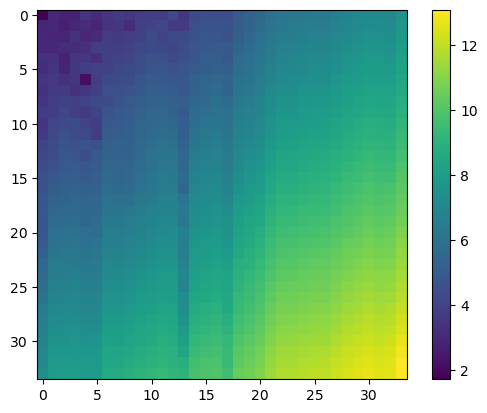

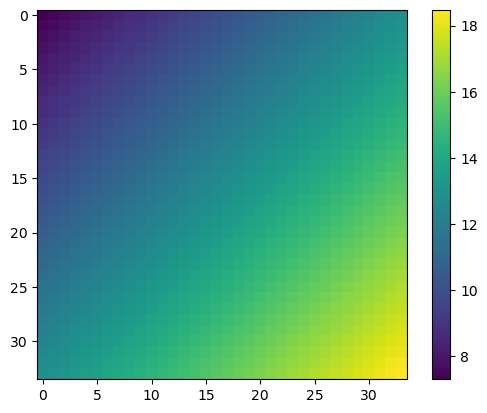

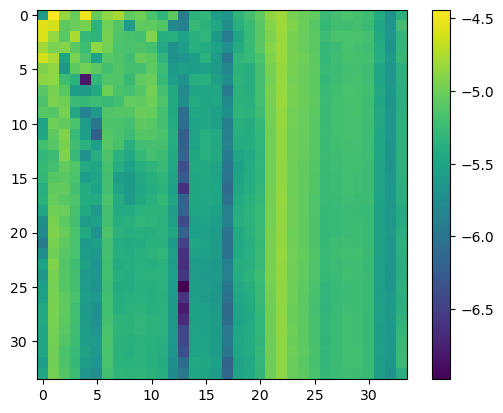

NameError: name 'napnap3_disc' is not defined

In [9]:
elb1 = 20

plt.imshow(np.log10(np.abs(Gtilden[0,15,15,0,elb1])))
plt.colorbar()
plt.show()

plt.imshow(np.log10(np.abs(Normn[15,15,0,elb1])))
plt.colorbar()
plt.show()

plt.imshow(np.log10(np.abs(Gtilden[0,15,15,0,elb1])/np.abs(Normn[15,15,0,elb1])))
plt.colorbar()
plt.show()

plt.semilogx(apradii, napnap3_disc[0][0].real)
plt.semilogx(apradii, napnap3_disc[0][0].imag)
plt.semilogx(apradii, nextp['mnnn'][0].real)
plt.semilogx(apradii, nextp['mnnn'][0].imag)



plt.show()

import numpy as np
import pyvista as pv



data = np.log10(gnnn.npcf_multipoles_norm[15,15,0].real)
data = np.log10(np.abs(gnnn.npcf_multipoles[0,15,15,0]))
volume = pv.wrap(data)
p = pv.Plotter()
p.add_volume(
    volume,
    cmap="viridis",
    opacity="sigmoid_5",   # <--- good transparent preset
    shade=True,
    specular=0.2,
    specular_power=10,
)
p.add_axes()
p.show()

float(nextp['ngal_source'])*(3*np.pi*(210-170)**2)**3

2025-11-26 19:03:05.377 (   0.752s) [    78B365D72740]vtkXOpenGLRenderWindow.:1458  WARN| bad X server connection. DISPLAY=
/users/lporth/anaconda3/envs/3PointEnv/lib/python3.10/site-packages/pyvista/jupyter/notebook.py:56: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


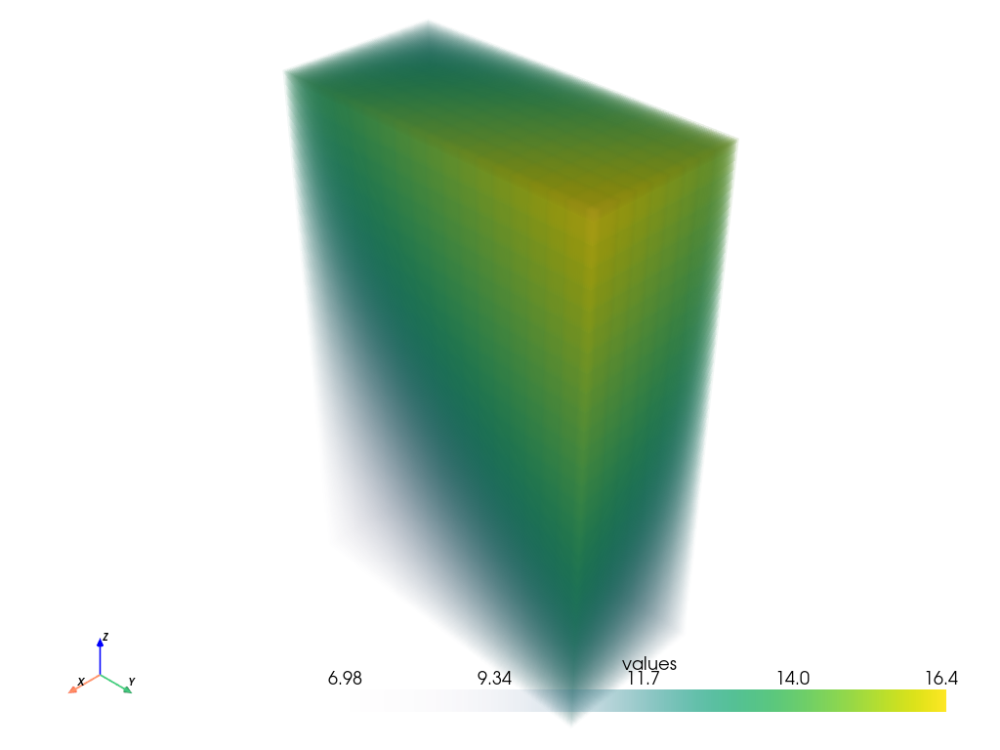

/users/lporth/anaconda3/envs/3PointEnv/lib/python3.10/site-packages/pyvista/jupyter/notebook.py:56: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


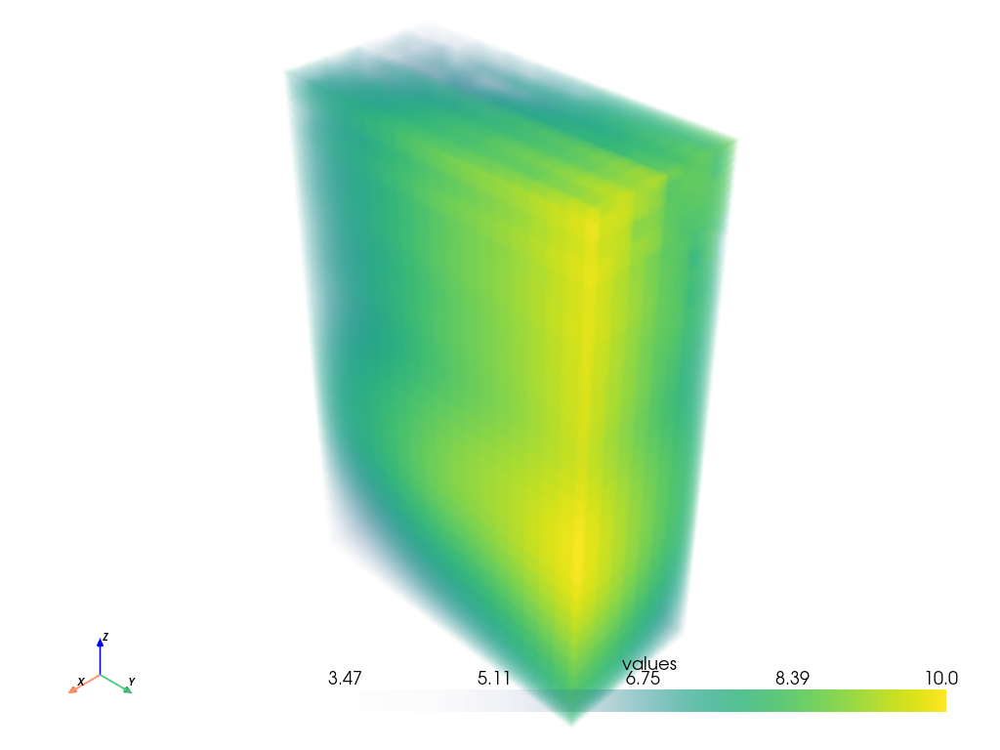

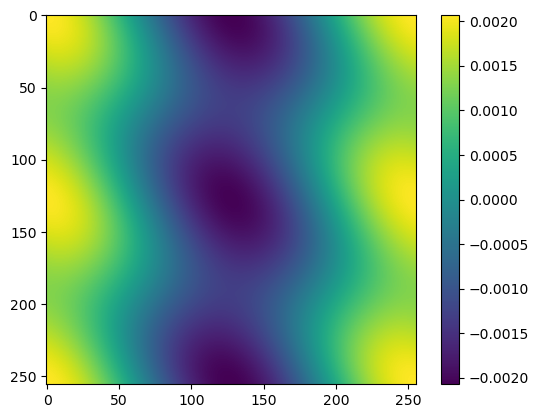

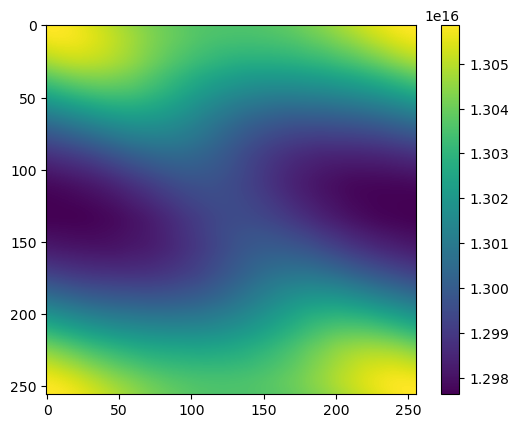

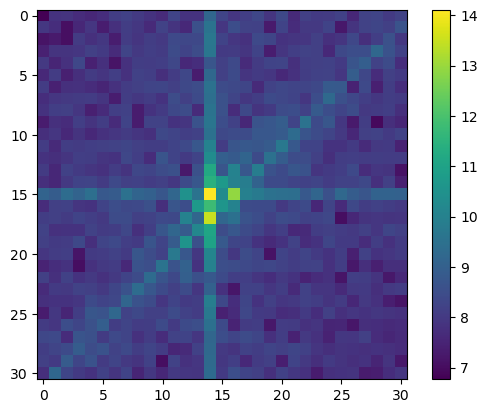

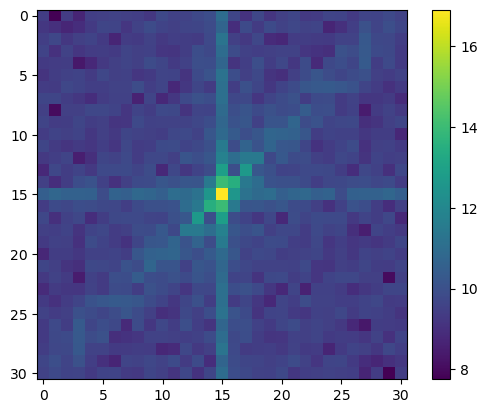

In [12]:

import numpy as np
import pyvista as pv

in1 = 15; in2 = 15
_max1=10; _max2=20; _max3=30

data = np.log10(np.abs(cumgnnn.npcf_multipoles_norm[in1,in2,0][:_max1,:_max2,:_max3]))
volume = pv.wrap(data)
p = pv.Plotter()
p.add_volume(
    volume,
    cmap="viridis",
    opacity="sigmoid_5",   # <--- good transparent preset
    shade=True,
    specular=0.2,
    specular_power=10,
)
p.add_axes()
p.show()

data = np.log10(np.abs(cumgnnn.npcf_multipoles[0,in1,in2,0][:_max1,:_max2,:_max3]))
volume = pv.wrap(data)
p = pv.Plotter()
p.add_volume(
    volume,
    cmap="viridis",
    opacity="sigmoid_5",   # <--- good transparent preset
    shade=False,
    specular=0.2,
    specular_power=10,
)
p.add_axes()
p.show()

cumgnnn.bin_centers_mean =cumcenters[0,0]
cumgnnn_fixedr1r2r3, cumnnnn_fixedr1r2r3 = cumgnnn.multipoles2npcf_singlethetcombi(_max1,_max2,_max3)

plt.imshow(cumgnnn_fixedr1r2r3[0].real)
plt.colorbar()
plt.show()

plt.imshow(cumnnnn_fixedr1r2r3.real)
plt.colorbar()
plt.show()

plt.imshow(np.log10(np.abs(cumgnnn.npcf_multipoles[0,:,:,0,_max1,_max2,_max3])))
plt.colorbar()
plt.show()
plt.imshow(np.log10(np.abs(cumgnnn.npcf_multipoles_norm[:,:,0,_max1,_max2,_max3])))
plt.colorbar()
plt.show()

In [62]:
import orpheus
base_patches = "/vol/euclidraid4/data/lporth/HigherOrderLensing/Mocks/Takahashi/GLASS/data/Euclidlike/patches/"
nextpatch = np.load(base_patches+"nside8192_real0_patch%i_linbias.npz"%(70))
zsel_lenses = (nextpatch["zbin"] == 1) * (nextpatch["isinner"]) # Considering innner part of patch is sufficient
zsel_sources = (nextpatch["zbin"] == 8) * (nextpatch["isinner"]) # Considering innner part of patch is sufficient
lensshuffle =  np.arange(np.sum(zsel_lenses))
sourceshuffle =  np.arange(np.sum(zsel_sources))
fthin_lens = 10
fthin_source = 1
np.random.shuffle(x=lensshuffle)
np.random.shuffle(x=sourceshuffle)
sources = orpheus.SpinTracerCatalog(spin=2,
                                        pos1=nextpatch["x"][zsel_sources][sourceshuffle][::fthin_source], 
                                        pos2=nextpatch["y"][zsel_sources][sourceshuffle][::fthin_source],
                                        tracer_1=nextpatch["gam1"][zsel_sources][sourceshuffle][::fthin_source],
                                        tracer_2=nextpatch["gam2"][zsel_sources][sourceshuffle][::fthin_source], 
                                        weight=None, zbins=None)
lenses = orpheus.ScalarTracerCatalog(pos1=nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens], 
                                        pos2=nextpatch["y"][zsel_lenses][lensshuffle][::fthin_lens], 
                                        isinner=nextpatch["isinner"][zsel_lenses][lensshuffle][::fthin_lens],
                                        tracer=np.ones_like(nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens]))
print(lenses.ngal, sources.ngal)

min_sep = 0.25
max_sep = 210.
binsize = 0.2
nbinsphi = 256
nmaxs=15
method = "DoubleTree"
tree_resos = [0,2.,4.]
rmin_pixsize = 30
apradii = np.geomspace(1,32,16)
fthin_source = 1
fthin_lens = 10
nthreads=48

pgnn = orpheus.GNNCorrelation(min_sep=min_sep, max_sep=max_sep, binsize=binsize, nmaxs=nmaxs, nbinsphi=nbinsphi,
                             method=method, tree_resos=tree_resos, rmin_pixsize=rmin_pixsize, verbosity=3, nthreads=nthreads)
mnn = pgnn.process(sources, lenses)
mapnap2 = pgnn.computeNNM(apradii)

pgnnnd = orpheus.GNNNCorrelation_NoTomo(min_sep=min_sep, max_sep=max_sep, binsize=binsize, nmaxs=nmaxs, nbinsphi=nbinsphi, multicountcorr=True,
                                      method="Discrete", tree_resos=tree_resos, rmin_pixsize=rmin_pixsize, verbosity=3, nthreads=nthreads)
pgnnnd.zweighting=None
mnnnd = pgnnnd.process(sources, lenses, statistics=["4pcf_multipole"], lowmem=False)
napnap3_disc = pgnnnd.computeMapNap3(apradii)

27968 271726
(0, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
3
(1, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
2
(2, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (2,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1.98506405 3.97012809]
(3, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (2,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1.99609676 3.99219353]
(4, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (4,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[  0.25  60.   120.   210.  ]
(5, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
0
(6, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
0
(7, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
2
(8, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (301075,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1. 1. 1. ... 1. 1. 1.]
(9, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (301075,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[1. 1. 1. ... 6. 7. 1.]
(10, <class 'num

/users/lporth/anaconda3/envs/orpheus_devel/lib/python3.12/site-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/users/lporth/anaconda3/envs/orpheus_devel/lib/python3.12/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


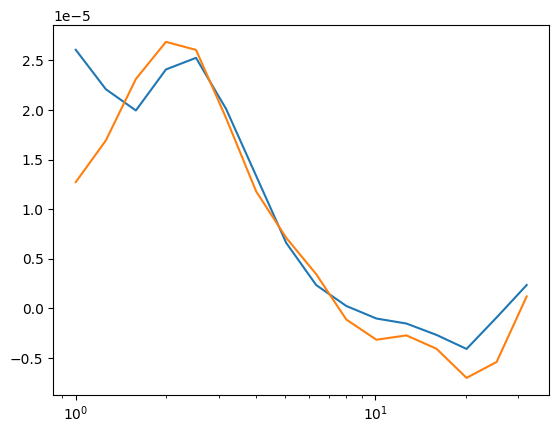

In [61]:
plt.semilogx(apradii,apradii*napnap3_tree[0][0])
plt.semilogx(apradii,apradii*napnap3_disc[0][0])

In [133]:
gnnn_conv, nnnn_conv = cumgnnn.multipoles2npcf_singletheta_nconvergence(12,13,14)

Done 100.00 per cent

In [137]:
nnnn_conv.shape

(16, 16, 256, 256)

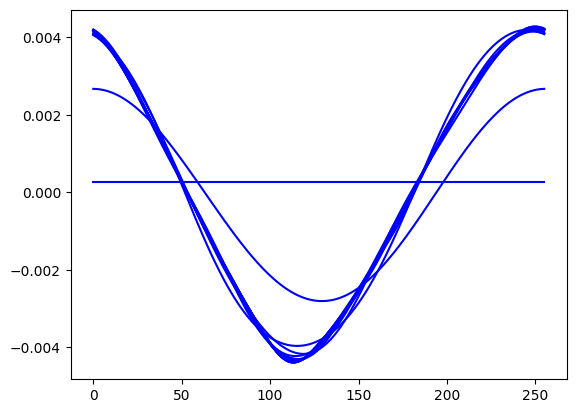

In [147]:
for i in range(16):
    plt.plot(gnnn_conv[0,i,i,111,:].real,'b-')

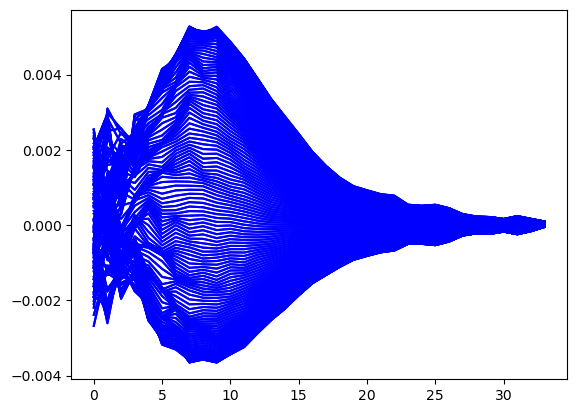

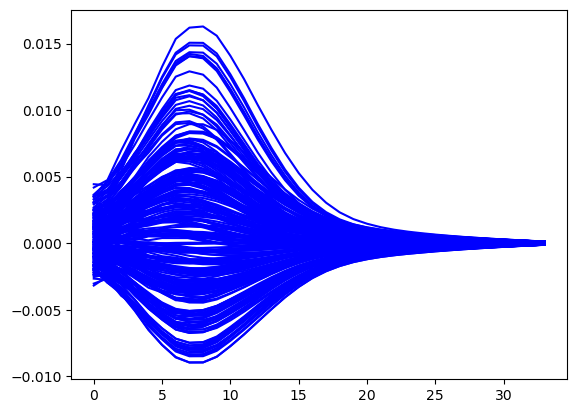

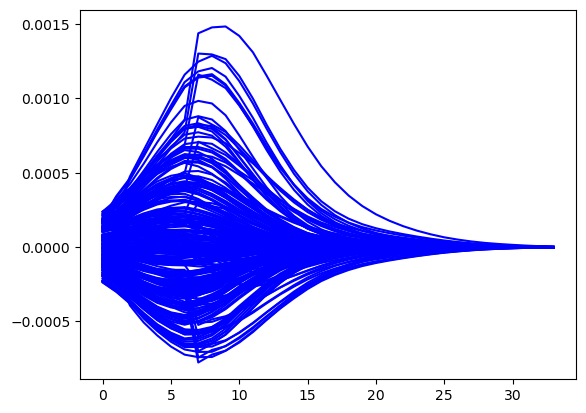

/tmp/ipykernel_460145/3930281935.py:25: RuntimeWarning: divide by zero encountered in divide
  plt.plot(gnnn_diags[:,0,elangle1,elangle2].real/gnngauss_diags[:,0,elangle1,elangle2].real,'b-')


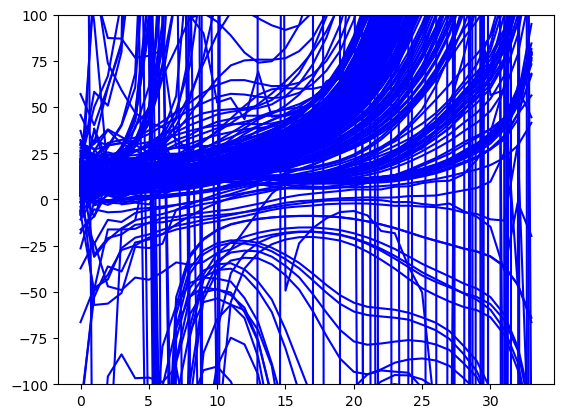

In [18]:
gnn.multipoles2npcf()
for elangle in range(256):
    plt.plot(np.diagonal(gnn.npcf[0,0,:,:,elangle]).real,'b-')
plt.show()

phis13, phis12 = np.meshgrid(cumgnnn.phis[0],cumgnnn.phis[1])
gnnn_diags = np.zeros((cumgnnn.nbinsr, 1, cumgnnn.nbinsphi[0], cumgnnn.nbinsphi[1]),dtype=complex)
gnngauss_diags = np.zeros((cumgnnn.nbinsr, 1, cumgnnn.nbinsphi[0], cumgnnn.nbinsphi[1]),dtype=complex)
for elr in range(cumgnnn.nbinsr):
    gnnn_diags[elr] += cumgnnn.multipoles2npcf_singlethetcombi(elr+0,elr,elr)[0]
    gnngauss_diags[elr] += gtilde_gauss(xinn_spl,xing_spl,cumgnnn.bin_centers_mean[elr+0],cumgnnn.bin_centers_mean[elr],cumgnnn.bin_centers_mean[elr],phis12,phis13)

for elangle1 in range(256)[2::16]:
    for elangle2 in range(256)[3::16]:
        plt.plot(gnnn_diags[:,0,elangle1,elangle2].real,'b-')
plt.show()

for elangle1 in range(256)[2::16]:
    for elangle2 in range(256)[3::16]:
        plt.plot(gnngauss_diags[:,0,elangle1,elangle2].real,'b-')
plt.show()

for elangle1 in range(256)[2::16]:
    for elangle2 in range(256)[3::16]:
        plt.plot(gnnn_diags[:,0,elangle1,elangle2].real/gnngauss_diags[:,0,elangle1,elangle2].real,'b-')
plt.ylim(-100,100)
plt.show()

/tmp/ipykernel_3766703/2552772594.py:3: RuntimeWarning: divide by zero encountered in divide
  plt.plot(.1/cumcenters[0,0]**.5*gnnn_diags[:,0,elangle1,elangle2].real/gnngauss_diags[:,0,elangle1,elangle2].real,'b-')


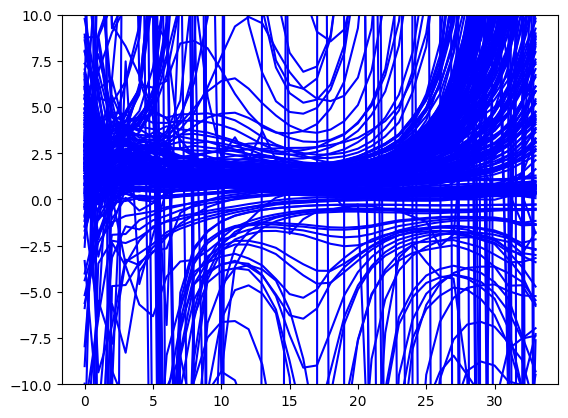

In [132]:
for elangle1 in range(256)[2::16]:
    for elangle2 in range(256)[3::16]:
        plt.plot(.1/cumcenters[0,0]**.5*gnnn_diags[:,0,elangle1,elangle2].real/gnngauss_diags[:,0,elangle1,elangle2].real,'b-')
plt.ylim(-10,10)
plt.show()

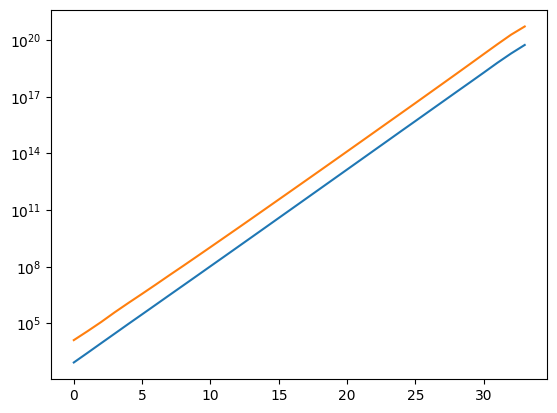

In [106]:
_Nn = nextp['Norm_n']
plt.semilogy(np.asarray([gnn.npcf_multipoles_norm[0,0,i,i].real for i in range(0,gnn.nbinsr-0)])*3.*np.pi*(gnn.bin_edges[1:]-gnn.bin_edges[:-1])**2)
plt.semilogy(np.asarray([_Nn[15,15,0,i,i,i].real for i in range(0,gnn.nbinsr-0)]))

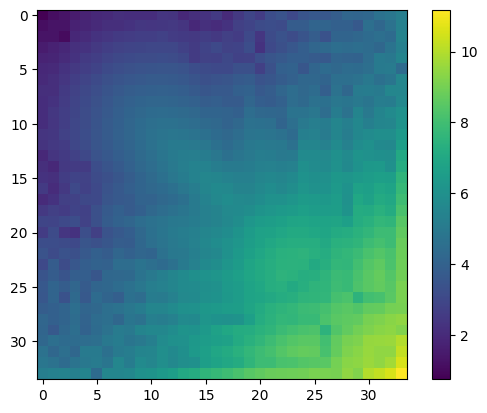

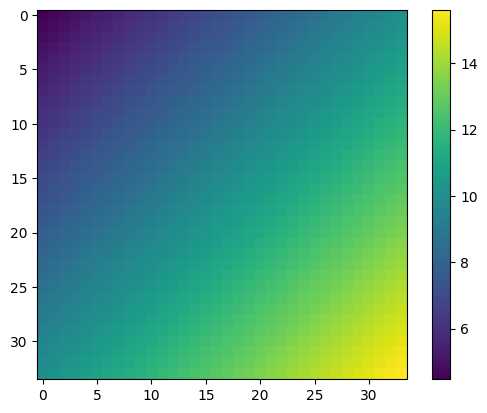

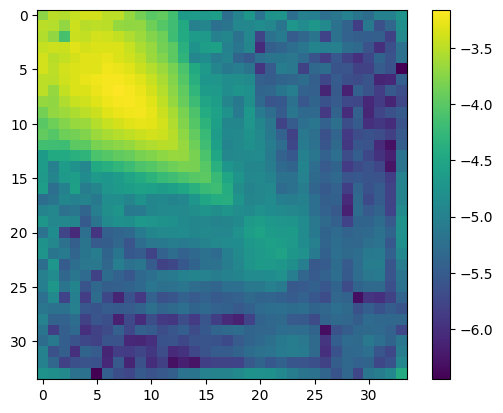

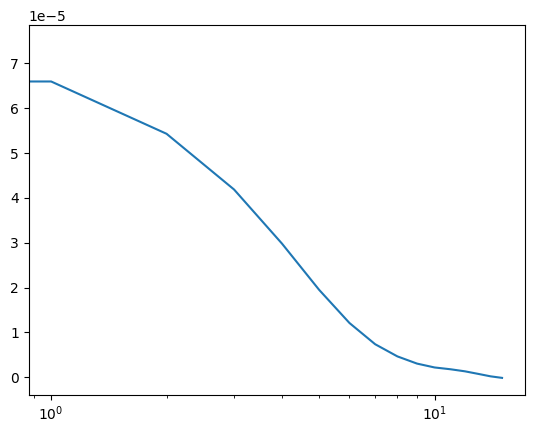

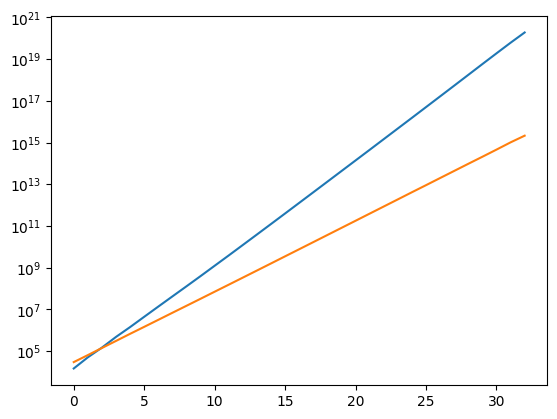

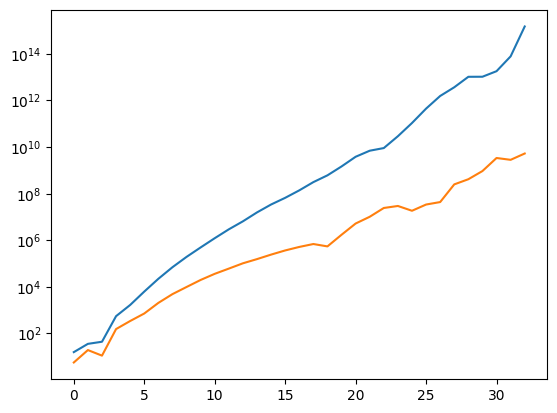

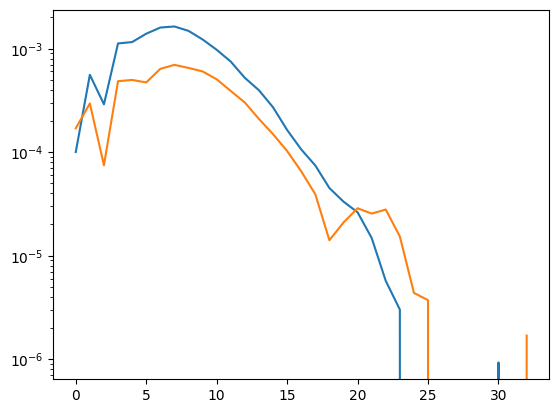

9.468556554805303e+17

In [83]:
plt.imshow(np.log10(np.abs(gnn.npcf_multipoles[0,0,0])))
plt.colorbar()
plt.show()

plt.imshow(np.log10(np.abs(gnn.npcf_multipoles_norm[0,0])))
plt.colorbar()
plt.show()

plt.imshow(np.log10(np.abs(gnn.npcf_multipoles[0,0,0])/np.abs(gnn.npcf_multipoles_norm[0,0])))
plt.colorbar()
plt.show()

plt.semilogx(mapnap2[0,0])
plt.show()

plt.semilogy([Normn[15,15,0,i,i,i] for i in range(33)])
plt.semilogy([gnn.npcf_multipoles_norm[0,0,i,i]for i in range(33)])
plt.show()

plt.semilogy(np.abs([Gtilden[0,15,15,0,i,i,i] for i in range(33)]))
plt.semilogy(np.abs([gnn.npcf_multipoles[0,0,0,i,i]for i in range(33)]))
plt.show()

plt.semilogy(np.asarray([Gtilden[0,15,15,0,i,i,i].real for i in range(33)])/np.asarray([Normn[15,15,0,i,i,i].real for i in range(33)]))
plt.semilogy(np.asarray([gnn.npcf_multipoles[0,0,0,i,i].real for i in range(33)])/np.asarray([gnn.npcf_multipoles_norm[0,0,i,i].real for i in range(33)]))
plt.show()

float(nextp['ngal_source'])*(3*np.pi*(210-170)**2)**3

In [17]:
import orpheus
from scipy.interpolate import interp1d

apradii = np.geomspace(1,32,16)
xinn_spl = interp1d(x=dat_kkcorr_hr_rshift['thetas'],y=dat_kkcorr_hr_rshift['kkcorr_ext'], bounds_error=False,fill_value=0)
xing_spl = interp1d(x=np.mean(napmap_fsky['bin_centers'],axis=0),y=np.mean(napmap_fsky['xi_ng'],axis=0), bounds_error=False,fill_value=0)

gnnn_gauss = orpheus.GNNNCorrelation_NoTomo(min_sep=0.25,max_sep=250., binsize=0.2, nbinsphi=150, nthreads=48, verbosity=3)
mapnap3 = gnnn_gauss.MapNap3analytic(mapradii=apradii, xing_spl=xing_spl, xinn_spl=xinn_spl, thetamin_xi=0.025, thetamax_xi=250., ntheta_xi=130, 
                                     nsubr=2, nsubsample_filter=1, batchsize=None, basis='MapMx')[0]

Using batchsize of 893 for radial bins
(0, <class 'numpy.float64'>, <class 'ctypes.c_double'>)
0.25
(1, <class 'numpy.float64'>, <class 'ctypes.c_double'>)
250.0
(2, <class 'numpy.int32'>, <class 'ctypes.c_int'>)
35
(3, <class 'numpy.ndarray'>, <class 'numpy.float64'>, (150,), <class 'numpy.ctypeslib.ndpointer_<f8_C_CONTIGUOUS'>)
[0.02094395 0.06283185 0.10471976 0.14660766 0.18849556 0.23038346
 0.27227136 0.31415927 0.35604717 0.39793507 0.43982297 0.48171087
 0.52359878 0.56548668 0.60737458 0.64926248 0.69115038 0.73303829
 0.77492619 0.81681409 0.85870199 0.90058989 0.9424778  0.9843657
 1.0262536  1.0681415  1.1100294  1.15191731 1.19380521 1.23569311
 1.27758101 1.31946891 1.36135682 1.40324472 1.44513262 1.48702052
 1.52890842 1.57079633 1.61268423 1.65457213 1.69646003 1.73834793
 1.78023584 1.82212374 1.86401164 1.90589954 1.94778745 1.98967535
 2.03156325 2.07345115 2.11533905 2.15722696 2.19911486 2.24100276
 2.28289066 2.32477856 2.36666647 2.40855437 2.45044227 2.49233017

In [15]:
dat_kkcorr_hr_rshift['napradii'][::2]/napmap_fsky['R'][4:]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

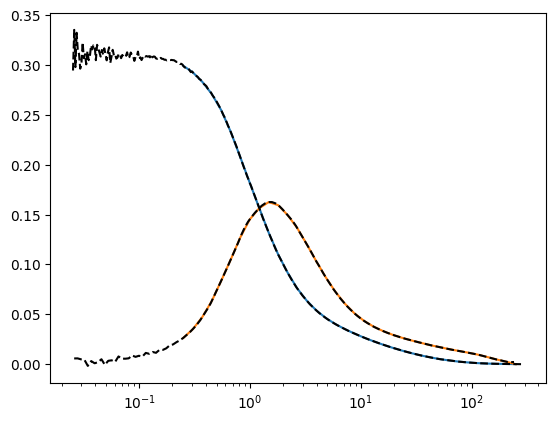

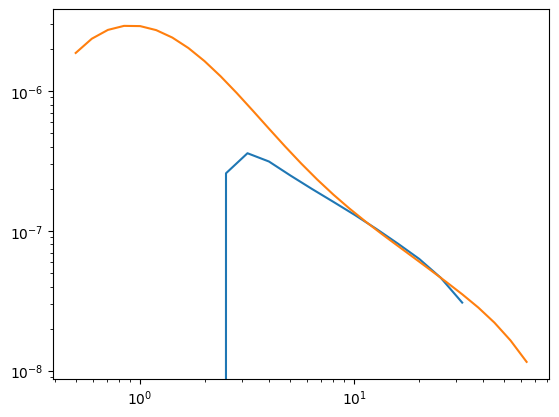

In [9]:
plt.semilogx(gnnn_gauss.bin_edges,xinn_spl(gnnn_gauss.bin_edges))
plt.semilogx(gnnn_gauss.bin_edges,100*xing_spl(gnnn_gauss.bin_edges))
plt.semilogx(dat_kkcorr_hr_rshift['thetas'],dat_kkcorr_hr_rshift['kkcorr_ext'],'k--')
plt.semilogx(np.mean(napmap_fsky['bin_centers'],axis=0),100*np.mean(napmap_fsky['xi_ng'],axis=0),'k--')
plt.show()

plt.loglog(apradii,mapnap3[0])
plt.loglog(napmap_fsky['R'][4:],1*dat_kkcorr_hr_rshift['nap2_ext'][::2]*napmap_mean[0,4:])

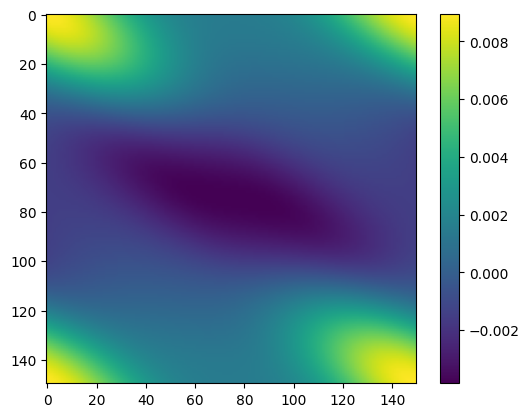

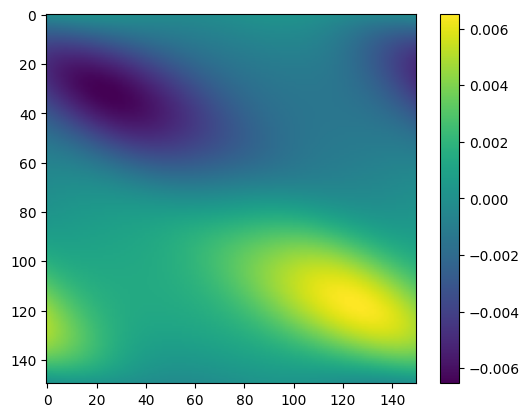

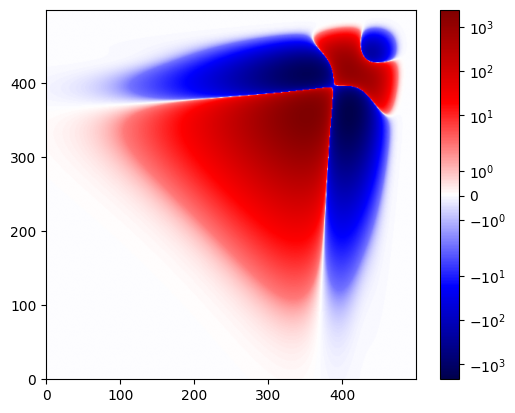

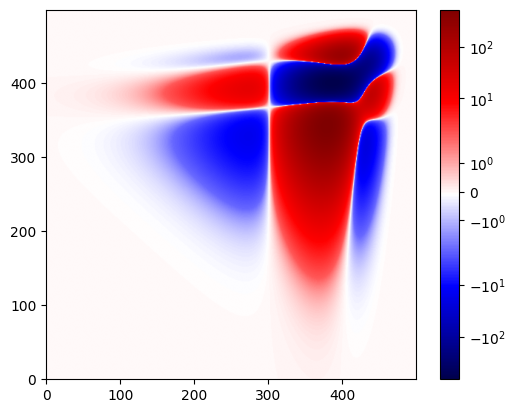

In [41]:
def N3Mfilter(y1,y2,y3,phis):
    phis13,phis12 = np.meshgrid(phis,phis)
    phis23 = phis13-phis12
    exp12_sqrt = np.exp(1J*.5*phis12); exp12=exp12_sqrt*exp12_sqrt; exp12c = np.conj(exp12)
    exp13_sqrt = np.exp(1J*.5*phis13); exp13=exp13_sqrt*exp13_sqrt; exp13c = np.conj(exp13)
    exp23_sqrt = np.exp(1J*.5*phis23); exp23=exp23_sqrt*exp23_sqrt; exp23c = np.conj(exp23)
    exp2312_sqrt=exp23_sqrt*np.conj(exp12_sqrt)
    g1 = y1 - 0.25*(y1        + y2*exp12c + y3*exp13c); g1c = np.conj(g1)
    g2 = y2 - 0.25*(y1*exp12  + y2        + y3*exp23c); g2c = np.conj(g2)
    g3 = y3 - 0.25*(y1*exp13  + y2*exp23  + y3       ); g3c = np.conj(g3)
    h = 0.25*(y1*exp13_sqrt + y2*exp2312_sqrt + y3*np.conj(exp13_sqrt))
    F1=2-np.real(g1*g1c); F2=2-np.real(g2*g2c); F3=2-np.real(g3*g3c)
    g1g2cexp12_re=np.real(g1*g2c*exp12); g1g3cexp13_re=np.real(g1*g3c*exp13); g2g3cexp23_re=np.real(g2*g3c*exp23)
    t1 = 2*g1g2cexp12_re*(F3-1) + 2*g1g3cexp13_re*(F2-1) + 2*g2g3cexp23_re*(F1-1) + 2*F1*F2*F3 - (F1*F2+F1*F3+F2*F3) + (F1+F2+F3-1.5)
    t2 = g1*exp13_sqrt*(g2g3cexp23_re+F2*F3-(F2+F3-1.5)) + g2*exp2312_sqrt*(g1g3cexp13_re+F1*F3-(F1+F3-1.5)) + g3*np.conj(exp13_sqrt)*(g1g2cexp12_re+F1*F2-(F1+F2-1.5))
    t3 = g1*g2*exp23*(F3-1.5) + g1*g3*(F2-1.5) + g2*g3*exp12c*(F1-1.5)
    csq = 1./16 * ( y1*y1+y2*y2+y3*y3 + 2*y1*y2*np.real(exp12)+2*y1*y3*np.real(exp13)+2*y2*y3*np.real(exp23) )
    b = 0.5*(y1*y1+y2*y2+y3*y3) - 2*csq
    measure = 1
    return np.exp(-b)/128 * measure * (h*h*t1 + 2*h*t2 + t3)

def N3Mfilter_y1y2grid(ys,y3,phi12,phi13):
    y1, y2 = np.meshgrid(ys,ys)
    phis12,phis13 = phi12, phi13
    phis23 = phis13-phis12
    exp12_sqrt = np.exp(1J*.5*phis12); exp12=exp12_sqrt*exp12_sqrt; exp12c = np.conj(exp12)
    exp13_sqrt = np.exp(1J*.5*phis13); exp13=exp13_sqrt*exp13_sqrt; exp13c = np.conj(exp13)
    exp23_sqrt = np.exp(1J*.5*phis23); exp23=exp23_sqrt*exp23_sqrt; exp23c = np.conj(exp23)
    exp2312_sqrt=exp23_sqrt*np.conj(exp12_sqrt)
    g1 = y1 - 0.25*(y1        + y2*exp12c + y3*exp13c); g1c = np.conj(g1)
    g2 = y2 - 0.25*(y1*exp12  + y2        + y3*exp23c); g2c = np.conj(g2)
    g3 = y3 - 0.25*(y1*exp13  + y2*exp23  + y3       ); g3c = np.conj(g3)
    h = 0.25*(y1*exp13_sqrt + y2*exp2312_sqrt + y3*np.conj(exp13_sqrt))
    F1=2-np.real(g1*g1c); F2=2-np.real(g2*g2c); F3=2-np.real(g3*g3c)
    g1g2cexp12_re=np.real(g1*g2c*exp12); g1g3cexp13_re=np.real(g1*g3c*exp13); g2g3cexp23_re=np.real(g2*g3c*exp23)
    t1 = 2*g1g2cexp12_re*(F3-1) + 2*g1g3cexp13_re*(F2-1) + 2*g2g3cexp23_re*(F1-1) + 2*F1*F2*F3 - (F1*F2+F1*F3+F2*F3) + (F1+F2+F3-1.5)
    t2 = g1*exp13_sqrt*(g2g3cexp23_re+F2*F3-(F2+F3-1.5)) + g2*exp2312_sqrt*(g1g3cexp13_re+F1*F3-(F1+F3-1.5)) + g3*np.conj(exp13_sqrt)*(g1g2cexp12_re+F1*F2-(F1+F2-1.5))
    t3 = g1*g2*exp23*(F3-1.5) + g1*g3*(F2-1.5) + g2*g3*exp12c*(F1-1.5)
    csq = 1./16 * ( y1*y1+y2*y2+y3*y3 + 2*y1*y2*np.real(exp12)+2*y1*y3*np.real(exp13)+2*y2*y3*np.real(exp23) )
    b = 0.5*(y1*y1+y2*y2+y3*y3) - 2*csq
    measure = 1
    return np.exp(-b)/128 * measure * (h*h*t1 + 2*h*t2 + t3)

n3m_f = N3Mfilter(0.1,1,1,gnnn_gauss.phis[0])
plt.imshow(n3m_f.real)
plt.colorbar()
plt.show()
plt.imshow(n3m_f.imag)
plt.colorbar()
plt.show()

theta = 5.
ys = np.geomspace(.03,10,500)
n3m_vary = N3Mfilter_y1y2grid(ys=ys,y3=1.,phi12=.1*np.pi,phi13=.2*np.pi)
renorm = (theta**3*np.meshgrid(ys,ys)[0]*np.meshgrid(ys,ys)[1])**2
plt.imshow(renorm*n3m_vary.real,norm='symlog',origin='lower',cmap='seismic')
plt.colorbar()
plt.show()
plt.imshow(renorm*n3m_vary.imag,norm='symlog',origin='lower',cmap='seismic')
plt.colorbar()





In [ ]:
inds = np.arange(np.sum(zsel_lenses))
np.random.shuffle(x=inds)
inds


array([760348, 798835, 598649, ...,  40706, 908979, 674870])

In [ ]:
elpatch = 10
base_patches = "/vol/euclidraid4/data/lporth/HigherOrderLensing/Mocks/Takahashi/GLASS/data/Euclidlike/patches/"
zlensbin=1
zsourcebin=8
fthin_source = 1
fthin_lens = 10
nextpatch = np.load(base_patches+"nside8192_real0_patch%i_linbias.npz"%(elpatch))
zsel_lenses = (nextpatch["zbin"] == zlensbin)
zsel_sources = (nextpatch["zbin"] == zsourcebin) * (nextpatch["isinner"]) # Considering innner part of patch is sufficient
lensshuffle =  np.arange(np.sum(zsel_lenses))
np.random.shuffle(x=lensshuffle)
sources = orpheus.SpinTracerCatalog(spin=2,
                                        pos1=nextpatch["x"][zsel_sources][::fthin_source], 
                                        pos2=nextpatch["y"][zsel_sources][::fthin_source],
                                        tracer_1=nextpatch["gam1"][zsel_sources][::fthin_source],
                                        tracer_2=nextpatch["gam2"][zsel_sources][::fthin_source], 
                                        weight=None, zbins=None)
lenses = orpheus.ScalarTracerCatalog(pos1=nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens], 
                                        pos2=nextpatch["y"][zsel_lenses][lensshuffle][::fthin_lens], 
                                        isinner=nextpatch["isinner"][zsel_lenses][lensshuffle][::fthin_lens],
                                        tracer=np.ones_like(nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens]))

In [ ]:
lenses.create_mask(method='Density',pixsize=4)
direct_lenses  = orpheus.Direct_NapnEqual(order_max=3,Rmin=apradii[0],Rmax=apradii[-1],nbinsr=len(apradii),accuracies=8,ap_weights='Identity')
nap2 = direct_lenses.process(lenses, Nbar_policy=1, dpix_innergrid=4.)

Done 16/16 aperture radii

(-0.012673040820756445, 0.02)

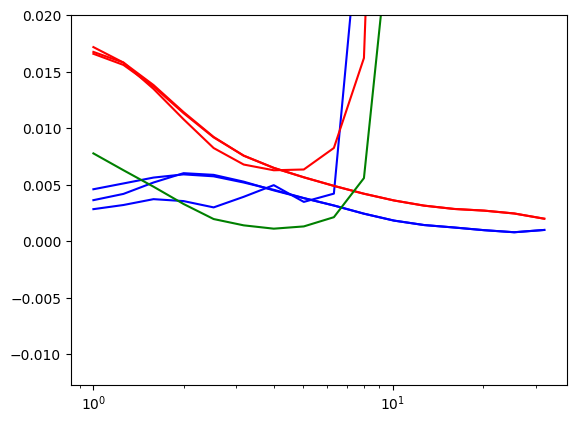

In [ ]:
nbar_global = 1#3./fthin_lens

plt.semilogx(direct_lenses.radii,nap2[0][:,0,0]/nbar_global,'b-')
plt.semilogx(direct_lenses.radii,nap2[0][:,1,0]/nbar_global,'b-')
plt.semilogx(direct_lenses.radii,nap2[0][:,2,0]/nbar_global,'b-')


plt.semilogx(direct_lenses.radii,nap2[0][:,0,1]/nbar_global**2,'r-')
plt.semilogx(direct_lenses.radii,nap2[0][:,1,1]/nbar_global**2,'r-')
plt.semilogx(direct_lenses.radii,nap2[0][:,2,1]/nbar_global**2,'r-')

plt.semilogx(direct_lenses.radii,nap2[0][:,0,2]/nbar_global**3,'g-')
plt.ylim(None,.02)

In [89]:
!pip install pyvista pyvistaqt


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.4/2.4 MB 28.2 MB/s  0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.3/112.3 MB 99.8 MB/s  0:00:01m0:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6/6 [pyvistaqt]/6 [pyvista]

[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [108]:
Gtilden.shape

(1, 31, 31, 1, 34, 34, 34)

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 248 249 250 251 252 253 254 255 256 257 258 259 260 261 262 263 264 265 266 267 268 269 270 271 272 273 274 275 276 27

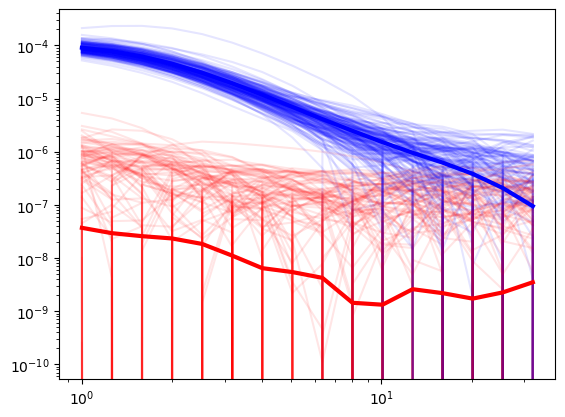

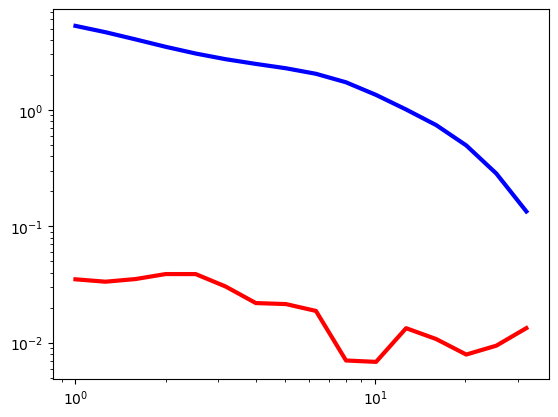

In [29]:

allmnn = None
patchmax = 1632
for elp in range(patchmax):
    sys.stdout.write("%i "%elp)
    nextp = np.load('/vol/euclidraid5/data/lporth/nonEuclid/G4LPaper/data/GNNN_mocks/t17mock_GNN_DoubleTree_patch%i.npz'%elp)
    if not elp%10:
        plt.loglog(nextp['apradii'],nextp['mnnn'][0].real,'b-',alpha=0.1)
        plt.loglog(nextp['apradii'],nextp['mnnn'][0].imag,'r-',alpha=0.1)
    if elp==0:
        allmnn = np.zeros((patchmax,*nextp['mnnn'][0].shape),dtype=complex)
        cumG3n = np.zeros_like(nextp['Gtilde_n'])
        cumN3n = np.zeros_like(nextp['Norm_n'])
        cumcenters = np.zeros_like(nextp['bin_centers'])
    allmnn[elp] += nextp['mnnn'][0]
    cumG3n += nextp['Gtilde_n']
    cumN3n += nextp['Norm_n']
    cumcenters += 1./patchmax * nextp['bin_centers']
plt.loglog(nextp['apradii'],np.mean(allmnn,axis=0).real,'b-',lw=3)
plt.loglog(nextp['apradii'],np.abs(np.mean(allmnn,axis=0).imag),'r-',lw=3)
plt.show()

plt.loglog(nextp['apradii'],np.mean(allmnn.real,axis=0)/np.std(allmnn.real,axis=0),'b-',lw=3)
plt.loglog(nextp['apradii'],np.abs(np.mean(allmnn.imag,axis=0)/np.std(allmnn.imag,axis=0)),'r-',lw=3)
plt.show()

In [184]:
import numpy as np
import sys
import gc
from time import time, process_time

import orpheus
import treecorr

# Parameters
nthreads = 16

zlensbin = 1
zsourcebin = 8

min_sep = 0.25
max_sep = 128.
binsize = 0.2
nbinsphi = 256
nmaxs=15
method = "Tree"
tree_resos = [0,2.]
rmin_pixsize = 50
bin_slop = 0.0
angle_slop = 0.05
apradii = np.geomspace(1,32,16)
fthin_source = 1
fthin_lens = 10

npatches = 1632
base_patches = "/vol/euclidraid4/data/lporth/HigherOrderLensing/Mocks/Takahashi/GLASS/data/Euclidlike/patches/"
base_save = "/vol/euclidraid5/data/lporth/nonEuclid/G4LPaper/data/GNNN_mocks/"

for elpatch in range(1):
    np.random.seed(elpatch)
    #sys.stdout.write("Run %i: Doing %i/%i \r"%(batch_run,elpatch+1,npatches))
    # Load patch, select data, and allocate orpheus catalog instances
    nextpatch = np.load(base_patches+"nside8192_real0_patch%i_linbias.npz"%(elpatch))
    zsel_lenses = (nextpatch["zbin"] == zlensbin) * (nextpatch["isinner"])
    zsel_sources = (nextpatch["zbin"] == zsourcebin) * (nextpatch["isinner"]) # Considering innner part of patch is sufficient
    lensshuffle =  np.arange(np.sum(zsel_lenses))
    sourceshuffle =  np.arange(np.sum(zsel_sources))
    np.random.shuffle(x=lensshuffle)
    np.random.shuffle(x=sourceshuffle)
    sources = orpheus.SpinTracerCatalog(spin=2,
                                            pos1=nextpatch["x"][zsel_sources][sourceshuffle][::fthin_source], 
                                            pos2=nextpatch["y"][zsel_sources][sourceshuffle][::fthin_source],
                                            tracer_1=nextpatch["gam1"][zsel_sources][sourceshuffle][::fthin_source],
                                            tracer_2=nextpatch["gam2"][zsel_sources][sourceshuffle][::fthin_source], 
                                            weight=None, zbins=None)
    lenses = orpheus.ScalarTracerCatalog(pos1=nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens], 
                                            pos2=nextpatch["y"][zsel_lenses][lensshuffle][::fthin_lens], 
                                            isinner=nextpatch["isinner"][zsel_lenses][lensshuffle][::fthin_lens],
                                            tracer=np.ones_like(nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens]))
    print(lenses.ngal, sources.ngal)
    # Define GN, process it and get mapnap
    tc_sources = treecorr.Catalog(x=nextpatch["x"][zsel_sources][sourceshuffle][::fthin_source],
                                  y=nextpatch["y"][zsel_sources][sourceshuffle][::fthin_source],
                                  g1=nextpatch["gam1"][zsel_sources][sourceshuffle][::fthin_source],
                                  g2=nextpatch["gam2"][zsel_sources][sourceshuffle][::fthin_source])
    tc_lenses = treecorr.Catalog(x=nextpatch["x"][zsel_lenses][lensshuffle][::fthin_lens],
                                  y=nextpatch["y"][zsel_lenses][lensshuffle][::fthin_lens])
    gn = treecorr.NGCorrelation(min_sep=min_sep, 
                                     max_sep=max_sep, 
                                     bin_size=binsize,
                                     bin_slop=bin_slop, 
                                     angle_slop=angle_slop)
    pt1 = process_time()
    t1 = time()
    gn.process(tc_lenses, cat2=tc_sources)
    mapnap = np.array(gn.calculateNMap(R=apradii))
    pt2 = process_time()
    t2 = time()

    # Define GNN, process it and get mapnap2
    gnn = orpheus.GNNCorrelation(min_sep=min_sep, max_sep=max_sep, binsize=binsize, nmaxs=1*nmaxs, nbinsphi=nbinsphi,
                                 method="Discrete", tree_resos=tree_resos, rmin_pixsize=rmin_pixsize, verbosity=2, nthreads=nthreads)
    gnn.zweighting=None
    pt3 = process_time()
    t3 = time()
    mnn = gnn.process(sources, lenses)
    mapnap2 = gnn.computeNNM(apradii)
    pt4 = process_time()
    t4 = time()
    
    """
    # Define GNNN, process it and get mapnap3
    gnnndcf = orpheus.GNNNCorrelation_NoTomo(min_sep=min_sep, max_sep=max_sep, binsize=binsize, nmaxs=nmaxs, nbinsphi=nbinsphi,multicountcorr=True,
                                          method=method, tree_resos=tree_resos, rmin_pixsize=rmin_pixsize, verbosity=3, nthreads=nthreads)
    gnnndcf.zweighting=None
    pt5 = process_time()
    t5 = time()
    mnnnf = gnnndcf.process(sources, lenses, statistics=["4pcf_multipole"], lowmem=False)
    pt6 = process_time()
    t6 = time()
    mapnapdcf = gnnndcf.computeMapNap3(apradii, nmax_trafo=None)
    pt7 = process_time()
    t7 = time()
    """

27616 283392
Done 97.83 per cent

In [149]:
gnnndcf.nbinsr**3*15/1e9*(2*gnnndcf.nmax+1)**2

2.02686432

/users/lporth/anaconda3/envs/orpheus_devel/lib/python3.12/site-packages/matplotlib/cbook.py:1709: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
/users/lporth/anaconda3/envs/orpheus_devel/lib/python3.12/site-packages/matplotlib/cbook.py:1345: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


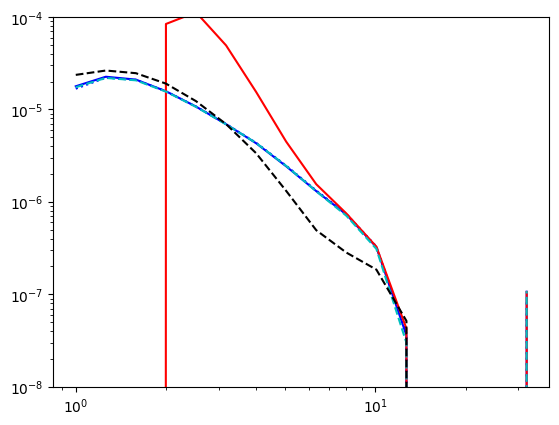

In [185]:
from matplotlib import pyplot as plt
plt.semilogx(apradii,mapnapdc[0][0],'b-')
plt.semilogx(apradii,mapnapdcf[0][0],'b:')
plt.semilogx(apradii,mapnap3[0][0],'r-')
plt.semilogx(apradii,mapnap3_15[0][0],'c--')
plt.semilogx(apradii,nextp['mnnn'][0],'k--')
plt.ylim(1e-8,1e-4)
plt.yscale('log')

nextp['mnnn'][0]

In [183]:
_i1 = itheta1; _i2=itheta2; _i3=itheta3
xing_spl(_thetaarr)
gnn.npcf_multipoles_norm.shape, gnnndc.npcf_multipoles_norm.shape, 

((31, 1, 32, 32), (31, 31, 1, 32, 32, 32))

[16.65558956 16.65558956 16.65558956]


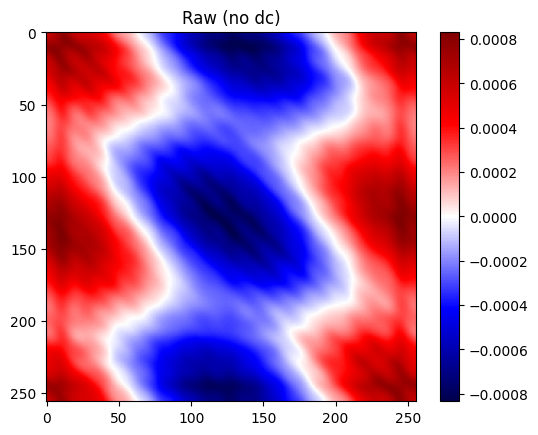

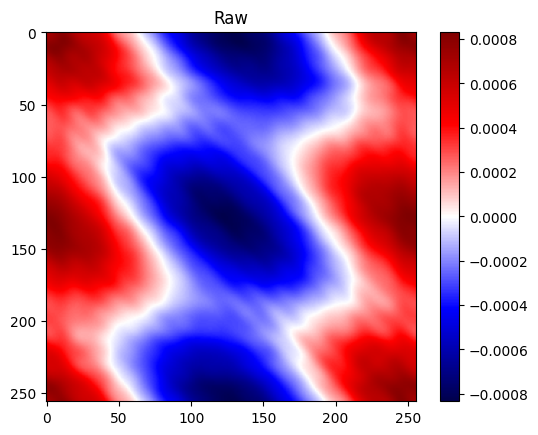

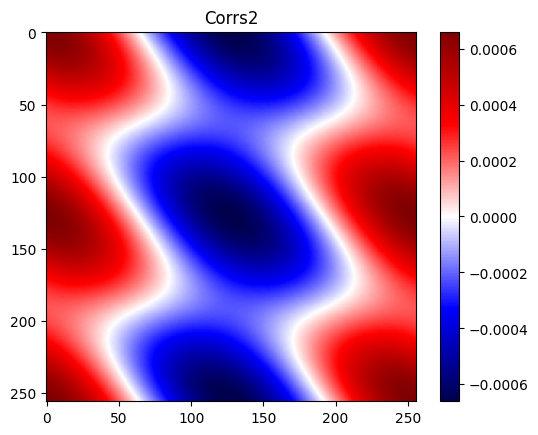

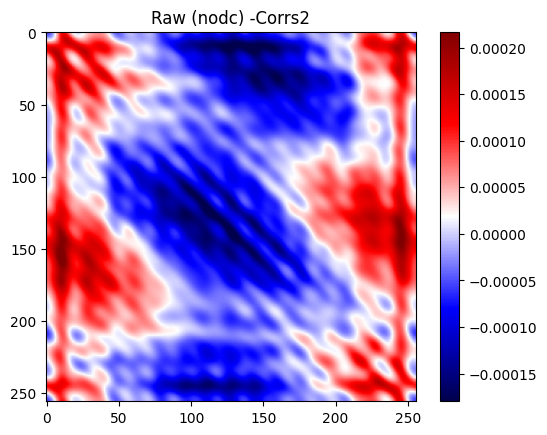

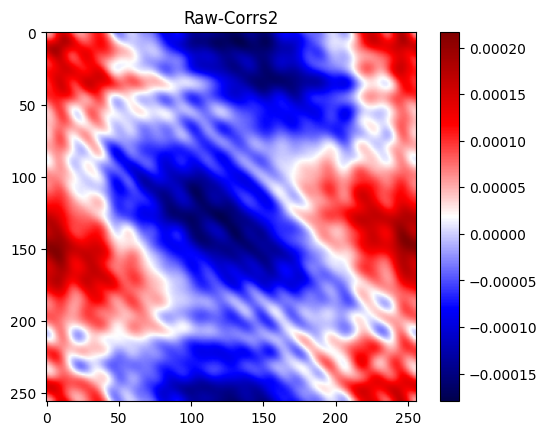

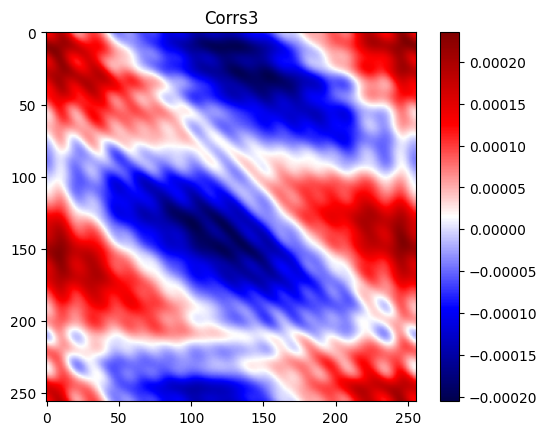

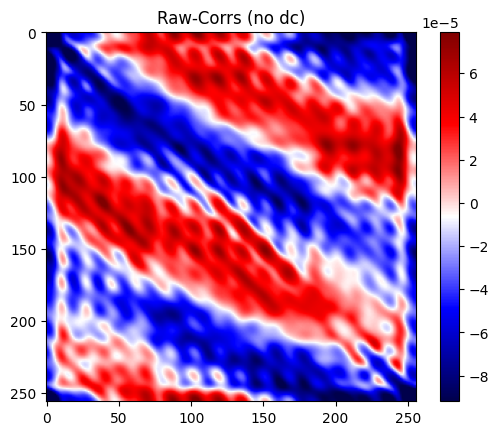

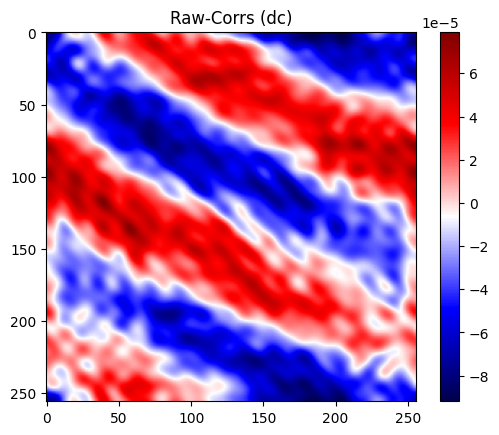

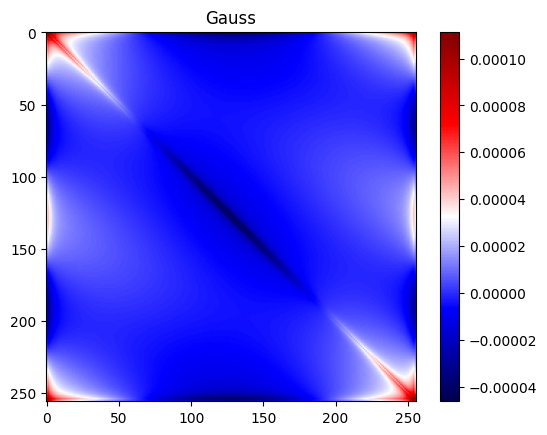

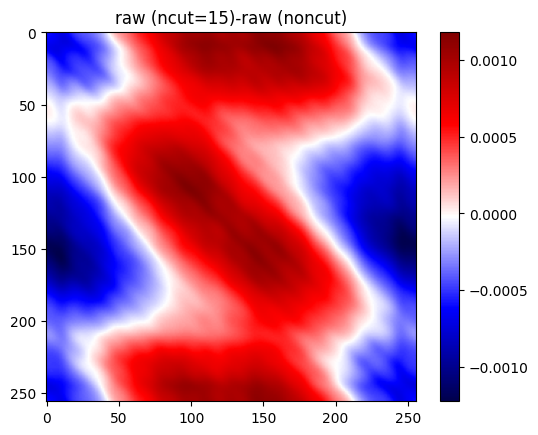

In [187]:
# Compare gaussian 4pcf and correstions to it
itheta1=21; itheta2=21; itheta3=21; nsubr=4
thetamin_xi = 0.25
thetamax_xi = 250.
dtheta_xi = 0.001
_thetaarr = np.arange(thetamin_xi,thetamax_xi,dtheta_xi)
gnnn.bin_centers_mean = gnn.bin_centers_mean
gnnndc.bin_centers_mean = gnn.bin_centers_mean
print(gnnn.bin_centers_mean[[itheta1,itheta2,itheta3]])
nrec = 15
if _i1 is not itheta1 or _i2 is not itheta2 or _i3 is not itheta3:
    #gnnn_nconv = gnnn.multipoles2npcf_singletheta_nconvergence(elthet1=itheta1,elthet2=itheta2,elthet3=itheta3)
    _i1 = itheta1; _i2=itheta2; _i3=itheta3
gnnn_realspace = gnnn.multipoles2npcf_singlethetcombi(elthet1=itheta1,elthet2=itheta2,elthet3=itheta3)
gnnn_realspacedc = gnnndc.multipoles2npcf_singlethetcombi(elthet1=itheta1,elthet2=itheta2,elthet3=itheta3)
gnnn_corrs2 = gnnn.gnnn_corrections(itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, xi_ng=gn.xi, 
                                       Gtilde_third=gnn.npcf, include_second=True, include_third=False)
gnnn_corrs3 = gnnn.gnnn_corrections(itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, xi_ng=gn.xi, 
                                       Gtilde_third=gnn.npcf, include_second=False, include_third=True)
gnnn_corrs = gnnn.gnnn_corrections(itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, xi_ng=gn.xi, 
                                      Gtilde_third=gnn.npcf, include_second=True, include_third=True)
gnnn_analytic = gnnn.gauss4pcf_analytic(
    itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, nsubr=nsubr, 
    xing_arr=xing_spl(_thetaarr), xinn_arr=xinn_spl(_thetaarr), thetamin_xi=thetamin_xi, thetamax_xi=thetamax_xi, dtheta_xi=dtheta_xi)


_gnnnr = gnnn_realspace[0][0].real
_gnnnrdc = gnnn_realspacedc[0][0].real
_corr2 = gnnn_corrs2[0].real
_corr3 = gnnn_corrs3[0].real
_corrt = gnnn_corrs[0].real

plt.imshow(_gnnnr.real,cmap='seismic',vmin=np.min(_gnnnrdc),vmax=np.max(_gnnnrdc))
plt.colorbar()
plt.title("Raw (no dc)")
plt.show()

plt.imshow(_gnnnrdc,cmap='seismic')
plt.colorbar()
plt.title("Raw")
plt.show()

plt.imshow(_corr2,cmap='seismic')
plt.colorbar()
plt.title("Corrs2")
plt.show()

plt.imshow(_gnnnr-_corr2,cmap='seismic',vmin=np.min(_gnnnrdc-_corr2),vmax=np.max(_gnnnrdc-_corr2))
plt.title("Raw (nodc) -Corrs2")
plt.colorbar()
plt.show()

plt.imshow(_gnnnrdc-_corr2,cmap='seismic')
plt.title("Raw-Corrs2")
plt.colorbar()
plt.show()

plt.imshow(_corr3.real,cmap='seismic')
plt.colorbar()
plt.title("Corrs3")
plt.show()

plt.imshow(_gnnnr-_corr2-_corr3,cmap='seismic',vmin=np.min(_gnnnrdc-_corrt), vmax=np.max(_gnnnrdc-_corrt))
plt.title("Raw-Corrs (no dc)")
plt.colorbar()
plt.show()

plt.imshow(_gnnnrdc-1*(_corr2+_corr3),cmap='seismic')
plt.title("Raw-Corrs (dc)")
plt.colorbar()
plt.show()

plt.imshow(gnnn_analytic[0].real,cmap='seismic')
plt.title("Gauss")
plt.colorbar()
plt.show()

plt.imshow(gnnn_nconv[0][0,nrec,nrec].real-gnnn_realspace[0][0].real,cmap='seismic')
plt.title("raw (ncut=%i)-raw (noncut)"%nrec)
plt.colorbar()
plt.show()

In [189]:
for elp in range(8):
    nextp = np.load("/vol/euclidraid5/data/lporth/nonEuclid/G4LPaper/data/GNNN_mocks/t17mock_GNNN_Tree_patch4_fthin1_10.npz")
nextp.files

['fthin_source',
 'fthin_lens',
 'ngal_source',
 'ngal_lenses',
 'nthreads',
 'min_sep',
 'max_sep',
 'binsize',
 'nbinsphi',
 'nmaxs',
 'apradii',
 'wall_times',
 'cpu_times',
 'bin_edges',
 'tc_bin_centers',
 'bin_centers',
 'gn',
 'Gtilden_third',
 'Normn_third',
 'Gtilden_fourth',
 'Normn_fourth',
 'mn',
 'mnn',
 'mnnn']

0 1 2 3 4 5 6 7 8 

KeyboardInterrupt: 

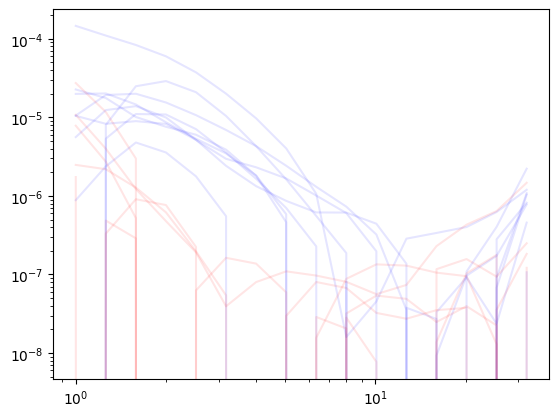

In [80]:
import numpy as np
from matplotlib import pyplot as plt
import sys

fbase = "/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/data/"
paths_kkcorr_hr_rshift =  [fbase+"t17mock_2pcffromkappag_nside16384_zbin1_patch%i_4_randomshift42.npz"%(patch) for patch in range(1,5)]

for elp,p in enumerate(paths_kkcorr_hr_rshift):
    nextp = np.load(p)
    if elp==0:
        dat_kkcorr_hr_rshift = {}
        for k in nextp.files:
            dat_kkcorr_hr_rshift[k] = np.zeros_like(nextp[k])
    for k in nextp.files:
        dat_kkcorr_hr_rshift[k] += 1./len(paths_kkcorr_hr_rshift)*nextp[k][:]

allmnnn = None
patchmax = 24
for elp in range(patchmax):
    sys.stdout.write("%i "%elp)
    nextp = np.load('/vol/euclidraid5/data/lporth/nonEuclid/G4LPaper/data/GNNN_mocks/t17mock_GNNN_Tree_patch%i_fthin1_10.npz'%elp)
    plt.loglog(nextp['apradii'],nextp['mnnn'][0].real,'b-',alpha=0.1)
    plt.loglog(nextp['apradii'],nextp['mnnn'][0].imag,'r-',alpha=0.1)
    if elp==0:
        allmnnn = np.zeros((patchmax,*nextp['mnnn'][0].shape),dtype=complex)
        cumgn = np.zeros_like(nextp['gn'])
        cumGn3 = np.zeros_like(nextp['Gtilden_third'])
        cumNn3 = np.zeros_like(nextp['Normn_third'])
        cumGn = np.zeros_like(nextp['Gtilden_fourth'])
        cumNn = np.zeros_like(nextp['Normn_fourth'])
        cumcenters = np.zeros_like(nextp['tc_bin_centers'])
    allmnnn[elp] += nextp['mnnn'][0]
    cumGn += nextp['Gtilden_fourth']
    cumNn += nextp['Normn_fourth']
    cumGn3 += nextp['Gtilden_third']
    cumNn3 += nextp['Normn_third']
    cumgn += 1./patchmax * nextp['gn']
    cumcenters += 1./patchmax * nextp['tc_bin_centers']
napmap_fsky = np.load("/vol/euclidraid4/data/lporth/HigherOrderLensing/FourthOrder/FourthOrderScalarPolar/data/Mocks_NG_zlens1_zsource8.npz")
napmap_mean = np.mean(napmap_fsky["NG"][:patchmax],axis=0)
plt.loglog(nextp['apradii'],np.mean(allmnnn,axis=0).real,'b-',lw=3)

In [2]:
#cumgnnn.npcf_multipoles.shape
cumgn


array([2.99801064e-04, 4.41257874e-04, 5.72462518e-04, 7.38113166e-04,
       9.90699186e-04, 1.15126694e-03, 1.35905680e-03, 1.45280423e-03,
       1.59621542e-03, 1.62917381e-03, 1.56300325e-03, 1.45946149e-03,
       1.32078964e-03, 1.16354857e-03, 1.00049021e-03, 8.42470265e-04,
       7.18131609e-04, 6.03378395e-04, 5.11390387e-04, 4.37643381e-04,
       3.84694932e-04, 3.42554621e-04, 2.92565134e-04, 2.43923878e-04,
       2.20317513e-04, 1.98102830e-04, 1.89943169e-04, 1.71125244e-04,
       1.52278214e-04, 1.20123178e-04, 9.19183088e-05, 6.82218788e-05])

In [4]:
%%time
import orpheus

ncut = 50
assert(ncut <= int(nextp['nmaxs']))

apradii = np.geomspace(1,32,16)
cumgnnn = orpheus.GNNNCorrelation_NoTomo(min_sep=float(nextp['min_sep']), max_sep=float(nextp['max_sep']), binsize=float(nextp['binsize']), 
                                         nmaxs=ncut, nbinsphi=int(nextp['nbinsphi']),
                                         method="Tree", verbosity=3, nthreads=54)
cumgnnn.bin_centers_mean = cumcenters
cumgnnn.npcf_multipoles = cumGn[:,50-ncut:50+ncut+1,50-ncut:50+ncut+1]
cumgnnn.npcf_multipoles_norm = cumNn[50-ncut:50+ncut+1,50-ncut:50+ncut+1]
cumgnnn.projection = "X"

cumgnn = orpheus.GNNCorrelation(min_sep=float(nextp['min_sep']), max_sep=float(nextp['max_sep']), binsize=float(nextp['binsize']), 
                                         nmaxs=ncut, nbinsphi=int(nextp['nbinsphi']),
                                         method="DoubleTree", verbosity=3, nthreads=54)
cumgnn.bin_centers_mean = cumcenters
cumgnn.npcf_multipoles = cumGn3[:,:ncut+1]
cumgnn.npcf_multipoles_norm = cumNn3[:ncut+1]
cumgnn.projection = "X"
cumgnn.nbinsz_source = 1
cumgnn.nbinsz_lens = 1
cumgnn.multipoles2npcf()
#cummnnn = cumgnnn.computeMapNap3(apradii)

from scipy.interpolate import interp1d
xinn_spl = interp1d(x=dat_kkcorr_hr_rshift['thetas'],y=1*dat_kkcorr_hr_rshift['kkcorr_ext'], bounds_error=False,fill_value=0)
xing_spl = interp1d(x=np.mean(napmap_fsky['bin_centers'],axis=0),y=np.mean(napmap_fsky['xi_ng'][:patchmax],axis=0), bounds_error=False,fill_value=0)

CPU times: user 409 ms, sys: 2.57 ms, total: 411 ms
Wall time: 409 ms


[20.23945252 20.23945252 16.65542163]


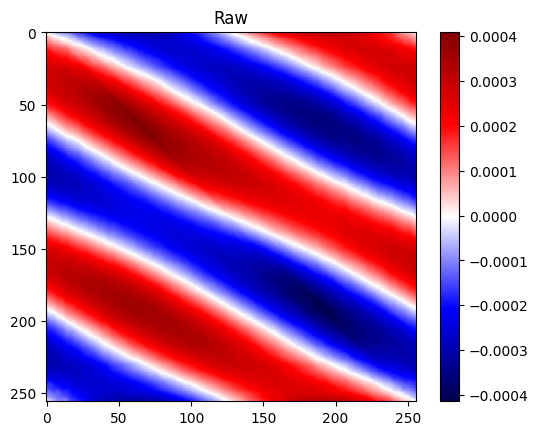

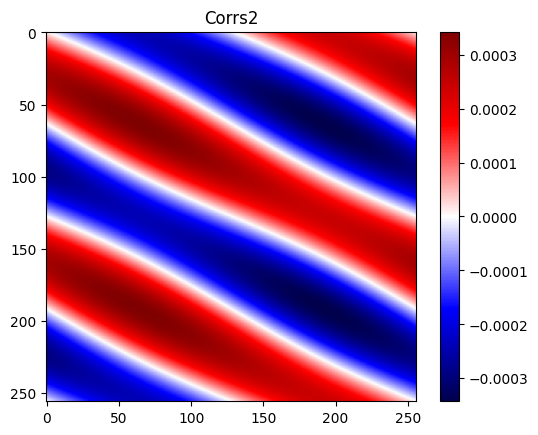

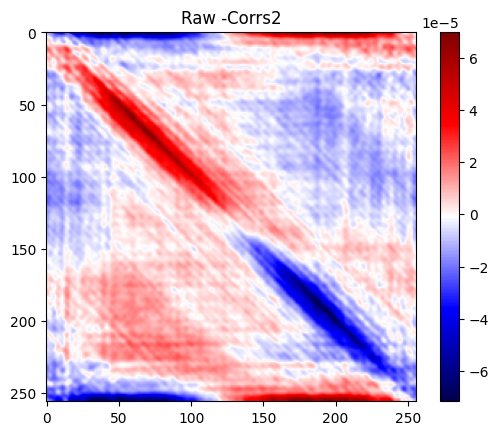

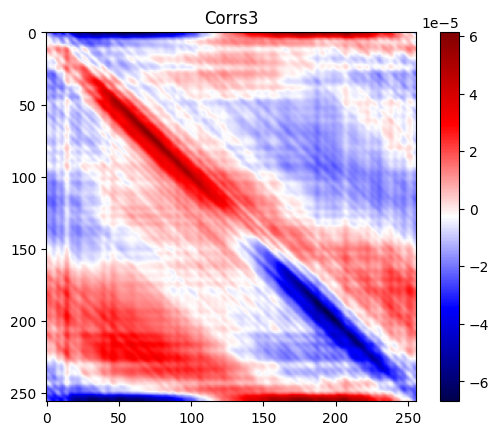

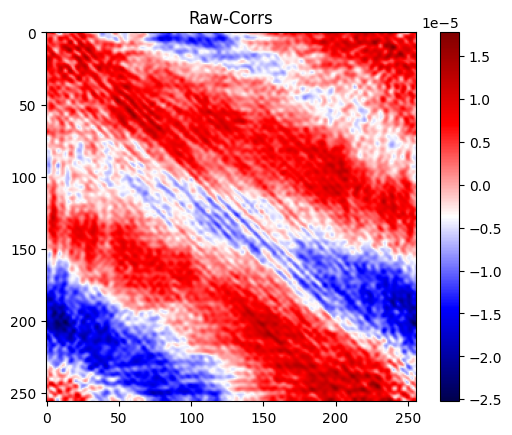

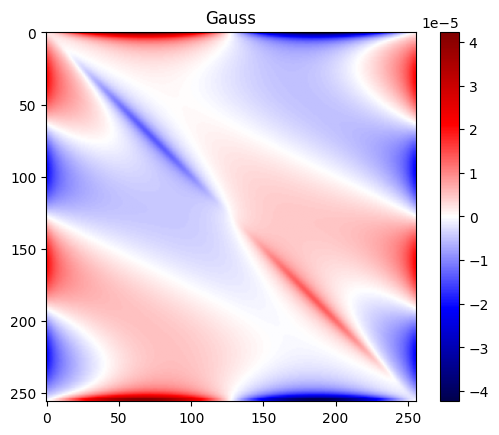

In [18]:
# Compare gaussian 4pcf and correstions to it
itheta1=22; itheta2=22; itheta3=21; nsubr=4
thetamin_xi = 0.25
thetamax_xi = 250.
dtheta_xi = 0.001
_thetaarr = np.arange(thetamin_xi,thetamax_xi,dtheta_xi)
print(cumgnnn.bin_centers_mean[[itheta1,itheta2,itheta3]])
nrec = 10
if _i1 is not itheta1 or _i2 is not itheta2 or _i3 is not itheta3:
    #gnnn_nconv = gnnn.multipoles2npcf_singletheta_nconvergence(elthet1=itheta1,elthet2=itheta2,elthet3=itheta3)
    _i1 = itheta1; _i2=itheta2; _i3=itheta3
gnnn_realspace = cumgnnn.multipoles2npcf_singlethetcombi(elthet1=itheta1,elthet2=itheta2,elthet3=itheta3)
gnnn_corrs2 = cumgnnn.gnnn_corrections(itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, xi_ng=cumgn, 
                                       Gtilde_third=cumgnn.npcf, include_second=True, include_third=False)
gnnn_corrs3 = cumgnnn.gnnn_corrections(itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, xi_ng=cumgn, 
                                       Gtilde_third=cumgnn.npcf, include_second=False, include_third=True)
gnnn_corrs = cumgnnn.gnnn_corrections(itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, xi_ng=cumgn, 
                                      Gtilde_third=cumgnn.npcf, include_second=True, include_third=True)
gnnn_analytic = cumgnnn.gauss4pcf_analytic(
    itheta1=itheta1, itheta2=itheta2, itheta3=itheta3, nsubr=nsubr, 
    xing_arr=xing_spl(_thetaarr), xinn_arr=xinn_spl(_thetaarr), thetamin_xi=thetamin_xi, thetamax_xi=thetamax_xi, dtheta_xi=dtheta_xi)


_gnnnr = gnnn_realspace[0][0].imag
_corr2 = gnnn_corrs2[0].imag
_corr3 = gnnn_corrs3[0].imag
_corrt = gnnn_corrs[0].imag
_gnnna = gnnn_analytic[0].imag

plt.imshow(_gnnnr,cmap='seismic')
plt.colorbar()
plt.title("Raw")
plt.show()


plt.imshow(_corr2,cmap='seismic')
plt.colorbar()
plt.title("Corrs2")
plt.show()

plt.imshow(_gnnnr-_corr2,cmap='seismic')
plt.title("Raw -Corrs2")
plt.colorbar()
plt.show()

plt.imshow(_corr3,cmap='seismic')
plt.colorbar()
plt.title("Corrs3")
plt.show()

plt.imshow(1.*_gnnnr-_corr2-_corr3,cmap='seismic')
plt.title("Raw-Corrs")
plt.colorbar()
plt.show()

plt.imshow(_gnnna,cmap='seismic')
plt.title("Gauss")
plt.colorbar()
plt.show()

In [81]:

import sys
import numpy as np
import orpheus
from matplotlib import pyplot as plt

patchmax = 145
for elp in range(patchmax):
    sys.stdout.write("%i "%elp)
    nextp = np.load('/vol/euclidraid5/data/lporth/nonEuclid/G4LPaper/data/GNNN_mocks/t17mock_NN_NNN_DoubleTree_patch%i_fthin1_nbarraid=100.00.npz'%elp)
    if elp==0:
        allxi2pt = np.zeros((patchmax,*nextp['xi_2pt'].shape),dtype=float)
        allxi2ptLS = np.zeros((patchmax,*nextp['xi_2pt_LS'].shape),dtype=float)
        allxi3ptSS = np.zeros((patchmax,*nextp['xi_3pt_SS'].shape),dtype=float)
        allxi3ptJB = np.zeros((patchmax,*nextp['xi_3pt_JB'].shape),dtype=float)
        cumNN = np.zeros_like(nextp['NN'],dtype=float)
        cumNNNn = np.zeros_like(nextp['NNN_n'],dtype=complex)
        cumcenters = np.zeros_like(nextp['bin_centers'])
    allxi2pt[elp] += 1*nextp['xi_2pt']
    allxi2ptLS[elp] += 1*nextp['xi_2pt_LS']
    allxi3ptSS[elp] += 1*nextp['xi_3pt_SS']
    allxi3ptJB[elp] += 1*nextp['xi_3pt_JB']
    cumNN += nextp['NN']
    cumNNNn += nextp['NNN_n']
    cumcenters += 1./patchmax * nextp['bin_centers']
    renorm_DR=100./3.
    cumxi2ptLS = renorm_DR**2*cumNN[0]/cumNN[3] - renorm_DR*(cumNN[1]+cumNN[2])/cumNN[3] + 1
    

0 1 2 3 4 5 6 7 8 9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79 80 81 82 83 84 85 86 87 88 89 90 91 92 93 94 95 96 97 98 99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 

[1.72745507 2.83417495]


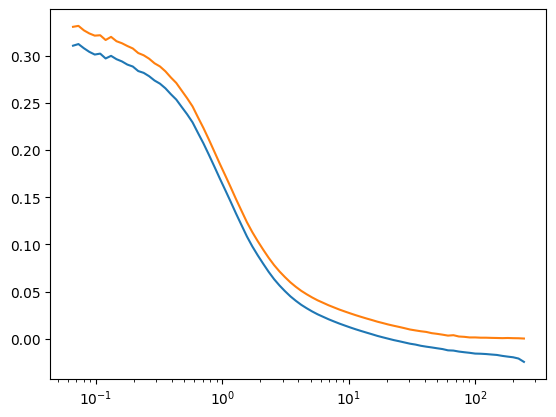

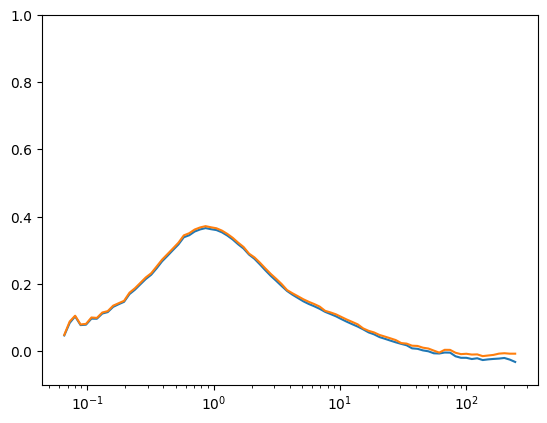

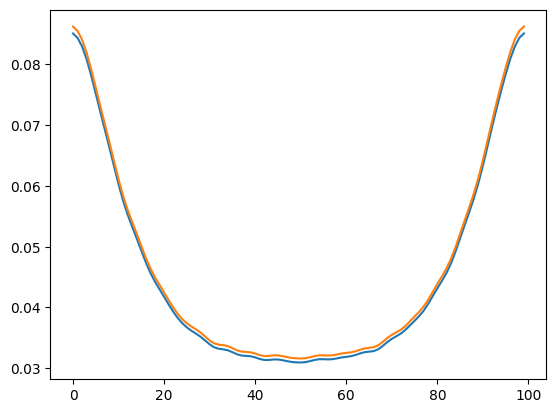

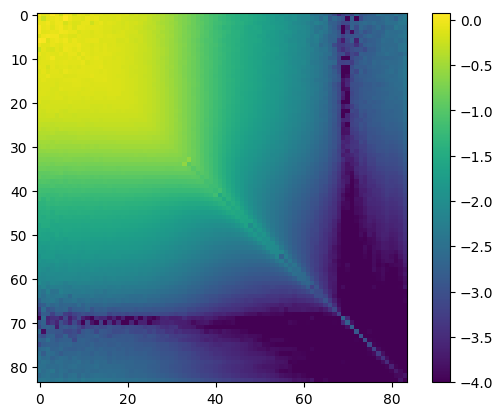

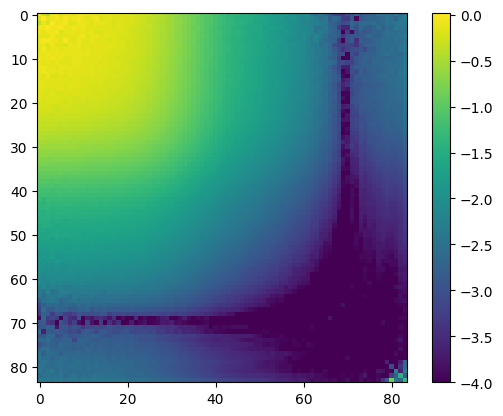

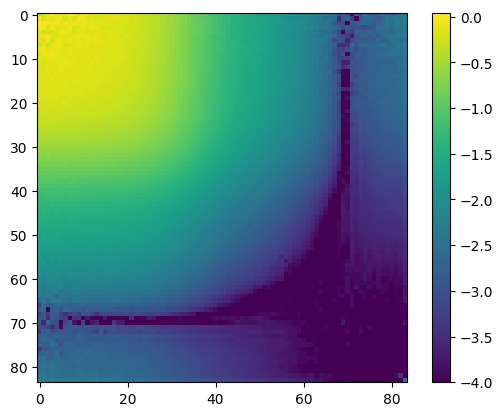

In [84]:
elb1 = 33
elb2 = 38
vmin=-4
print(cumcenters[[elb1,elb2]])


plt.semilogx(cumcenters,np.mean(allxi2pt,axis=0))
plt.semilogx(cumcenters,cumxi2ptLS)
plt.show()

plt.semilogx(cumcenters,cumcenters*np.diag(np.mean(allxi3ptSS,axis=0)[:,:,2]))
plt.semilogx(cumcenters,cumcenters*np.diag(np.mean(allxi3ptJB,axis=0)[:,:,-3]))
plt.ylim(-.1,1)
plt.show()

plt.plot(np.mean(allxi3ptSS,axis=0)[elb1,elb2])
plt.plot(np.mean(allxi3ptJB,axis=0)[elb1,elb2])
plt.show()

plt.imshow(np.log10(np.abs(np.mean(allxi3ptSS.real,axis=0))[:,:,0]),vmin=vmin)
plt.colorbar()
plt.show()

plt.imshow(np.log10(np.abs(np.mean(allxi3ptSS.real,axis=0))[:,:,50]),vmin=vmin)
plt.colorbar()
plt.show()

plt.imshow(np.log10(np.abs(np.mean(allxi3ptSS.real,axis=0))[:,:,30]),vmin=vmin)
plt.colorbar()
plt.show()
